In [ ]:
# to_save, to_load = False, True
# session_file = "./tmp/TIC_417436377_EA_contaminated_by_TIC_417436387.pkl"

# # load/save the notebook session
# # https://dill.readthedocs.io/en/latest/
# if True: 
#     import dill
#     dill.load_module(session_file)
#     print(f"Notebook session loaded from  {session_file}")

# if True:  # save the notebook session
#     import dill
#     dill.dump_module(session_file)
#     print(f"Notebook session saved in {session_file}")


In [1]:
import sys
if "../" not in sys.path:  # to get my usual helpers at base dir
    sys.path.append("../")

import lightkurve as lk
from lightkurve_ext import of_sector, of_sectors, of_2min_cadences
import lightkurve_ext as lke
from lightkurve_ext import TransitTimeSpec, TransitTimeSpecList
import lightkurve_ext_tess as lket
import lightkurve_ext_pg as lke_pg
import lightkurve_ext_pg_runner as lke_pg_runner
import tic_plot as tplt

import asyncio_compat

import math
import re
import warnings

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib

import pandas as pd
import astropy as astropy
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time, TimeDelta
from astropy.io import fits

from matplotlib.ticker import (FormatStrFormatter, AutoMinorLocator)

from importlib import reload # useful during development to reload packages

from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7


# No longer works in Jupyter 7+
display(Javascript("""
// export notebook url to Python for bokeh-based interactive features
if (window["IPython"] != null) {
  IPython.notebook.kernel.execute(`notebook_url = "${window.location.origin}"`);
} else {
  console.warn("IPython js object not available (in Jupyter 7). Hardcode notebook_url in the notebook itself instead.")
}
"""));
notebook_url = "localhost:8888"

%matplotlib inline

# data cache config
lk_download_dir = '../data'
if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir

# make markdown table aligned to the left of the cell output (instead of center)
display(HTML("<style>table {margin-left: 4ch;}</style>"))

<IPython.core.display.Javascript object>

# TIC 385464250  / V0845 Car / Gaia DR3 5300567887617312512  Analysis (ROT+EA+UV)

- revise existing VSX entry , https://vsx.aavso.org/index.php?view=detail.top&oid=88911
- exising type RS, tentatively changed to ROT+EA+UV


## TESS Data

In [12]:
tic = 385464250

sr = lk.search_lightcurve(f"TIC{tic}", )  # author="SPOC", cadence="short"
sr_unfiltered = sr  # keep a copy
# sr = lke.filter_by_priority(sr, author_priority = ["SPOC", "TESS-SPOC", "QLP"])
sr = lke.filter_by_priority(sr, author_priority = ["QLP", ])  # prefer QLP over SPOC / TESS-SPOC for consistency. Lost 2 sectors (S89, 90) of min cadence data , but QLP's 200sec is close, but SPOC PDCSAP_FLUX in S90 distored the LC
# sr = sr[sr.author == "QLP"]  # for uniformity, only 1 sector (3) has no QLP data
# sr = lke._sort_chronologically(sr)

astropy.table.pprint.conf.max_lines = 100  # to print all rows
display(sr)

# Note: only 1 sector of ready made lightcurve
# if needed, lightcurves can be created from sectors 37, 63, 64 (and in the future 90, 99, 100, 101)
lcc_tess = sr.download_all()
lcc_tess

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 09,2019,QLP,1800,385464250,0.0,N/A
1,TESS Sector 10,2019,QLP,1800,385464250,0.0,N/A
2,TESS Sector 35,2021,QLP,600,385464250,0.0,N/A
3,TESS Sector 36,2021,QLP,600,385464250,0.0,N/A
4,TESS Sector 37,2021,QLP,600,385464250,0.0,N/A
5,TESS Sector 62,2023,QLP,200,385464250,0.0,N/A
6,TESS Sector 63,2023,QLP,200,385464250,0.0,N/A
7,TESS Sector 64,2023,QLP,200,385464250,0.0,N/A
8,TESS Sector 89,2025,QLP,200,385464250,0.0,N/A


LightCurveCollection of 10 objects:
    0: <TessLightCurve LABEL="TIC 385464250" SECTOR=9 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    1: <TessLightCurve LABEL="TIC 385464250" SECTOR=10 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    2: <TessLightCurve LABEL="TIC 385464250" SECTOR=35 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    3: <TessLightCurve LABEL="TIC 385464250" SECTOR=36 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    4: <TessLightCurve LABEL="TIC 385464250" SECTOR=37 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    5: <TessLightCurve LABEL="TIC 385464250" SECTOR=62 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    6: <TessLightCurve LABEL="TIC 385464250" SECTOR=63 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    7: <TessLightCurve LABEL="TIC 385464250" SECTOR=64 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    8: <TessLightCurve LABEL="TIC 385464250" SECTOR=89 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    9: <TessLightCurve LABEL="TIC 385464250" SECTOR=90 AUTHOR=QLP FLUX_ORIGIN=sap_flux>

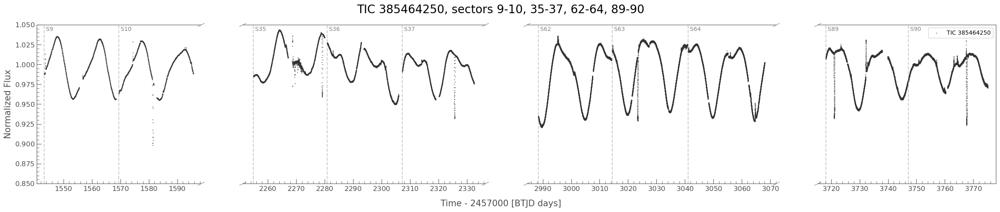

In [45]:
lc = lke.stitch(lcc_tess, ignore_incompatible_column_warning=True, )

axs = tplt.plot_skip_data_gap(lc, figsize=(30,5), s=1, alpha=0.9);
axs[0].get_figure().suptitle(f"{lc.label}, sectors {lke.abbrev_sector_list(lc)}", fontsize=20);
[ax.set_ylim(0.85, 1.05) for ax in axs];

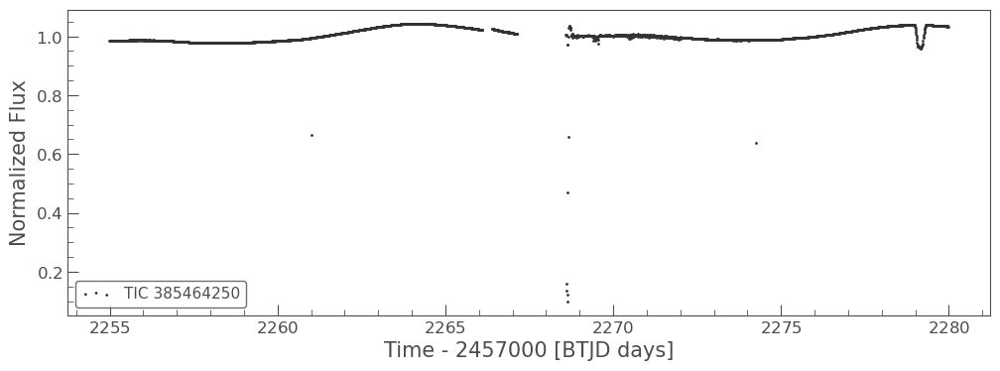

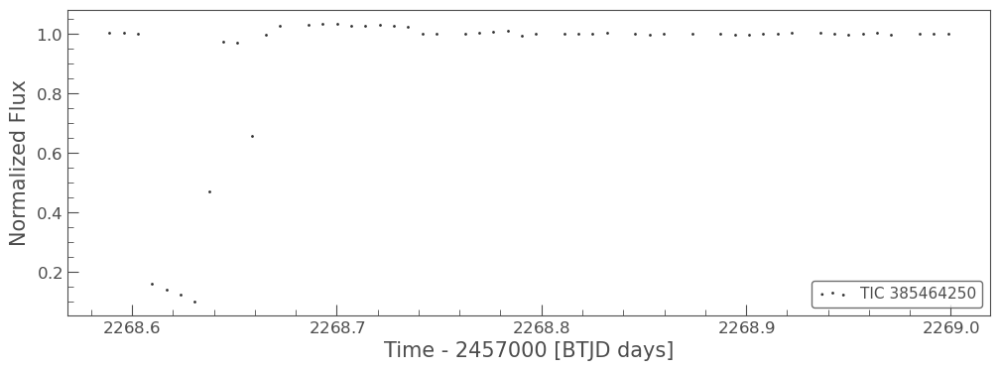

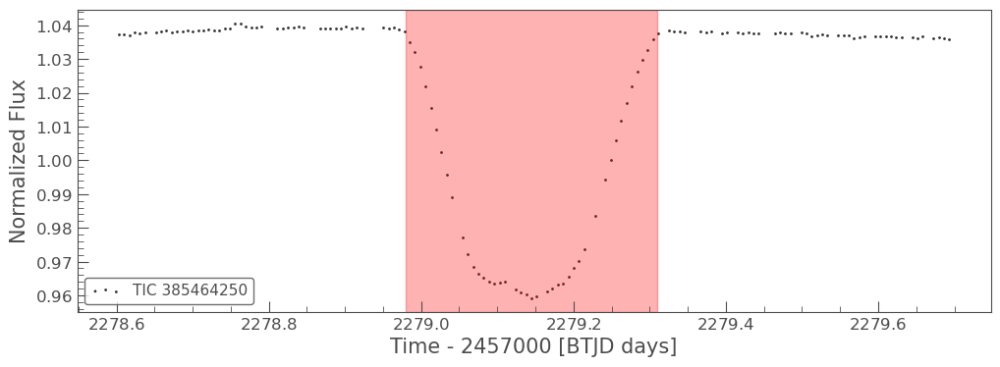

In [55]:
lc = lke.of_sector(lcc_tess, 35).normalize()
ax = tplt.scatter(lc, figsize=(12, 4))

# see the extremee ouliers
ax = tplt.scatter(lc.truncate(2268, 2269), figsize=(12, 4))

# see an eclipse
ax = tplt.scatter(lc.truncate(2278.6, 2279.7), figsize=(12, 4))
ax.axvspan(2278.98, 2278.9 + 0.41, color="red", alpha=0.3); 

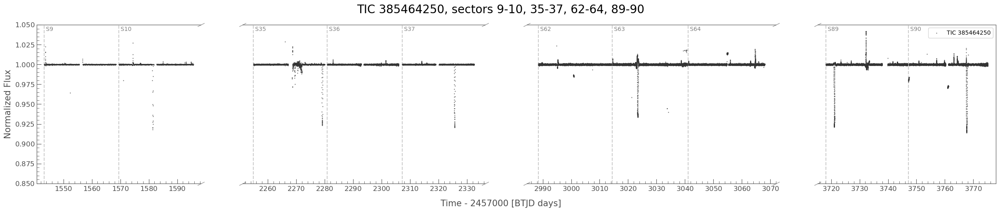

In [44]:
# see detrended LC for eclipses
lc = lke.stitch(lcc_tess, corrector_func=lambda lc: lke.select_flux(lc, ["det_flux", "kspsap_flux"]).normalize(),  ignore_incompatible_column_warning=True,)

axs = tplt.plot_skip_data_gap(lc, figsize=(30,5), s=1, alpha=0.9);
axs[0].get_figure().suptitle(f"{lc.label}, sectors {lke.abbrev_sector_list(lc)}", fontsize=20);
[ax.set_ylim(0.85, 1.05) for ax in axs];

### Source Identifcation of the Variabilities

The observed variabilities in TESS data are all from the target.

In per-pixel plots, the variabilities all have similar spread centered around the target.

Rotational Variability:

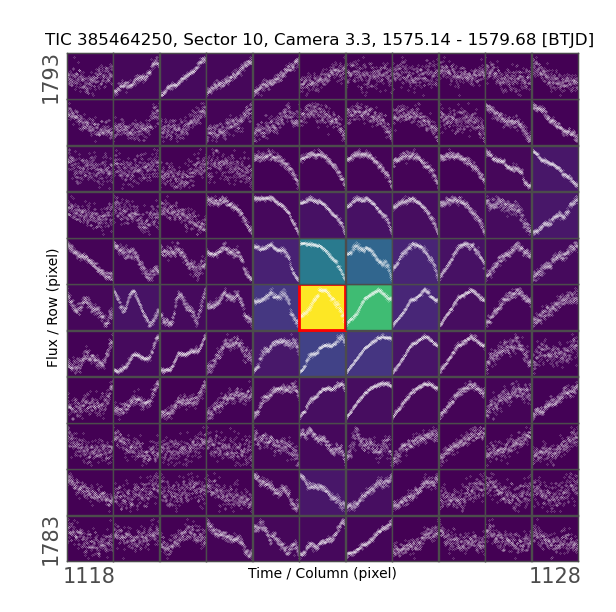

---

Eclipses:

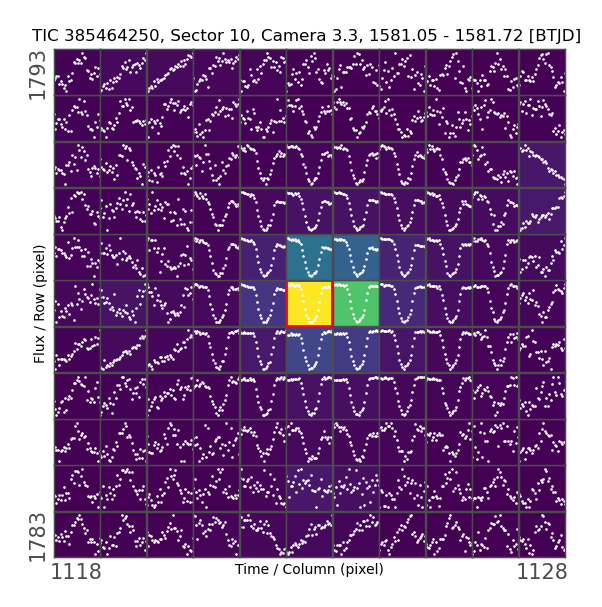

---

Flares:

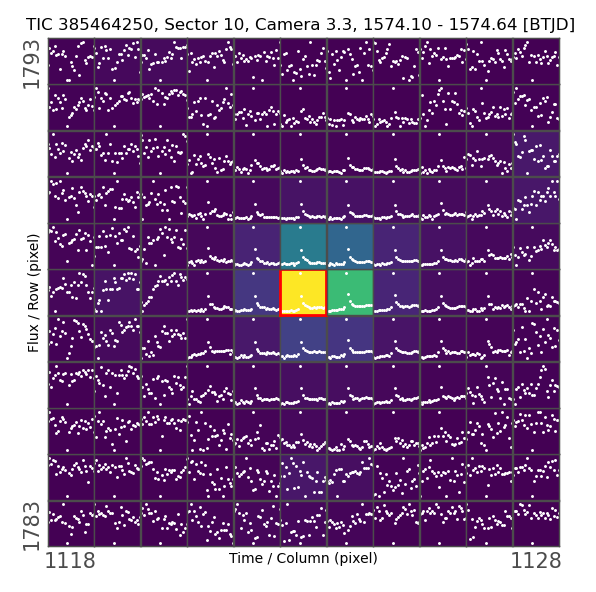

## ASAS3 data

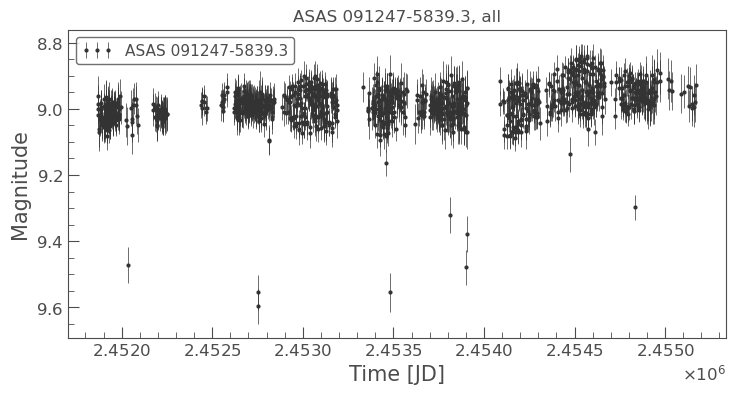

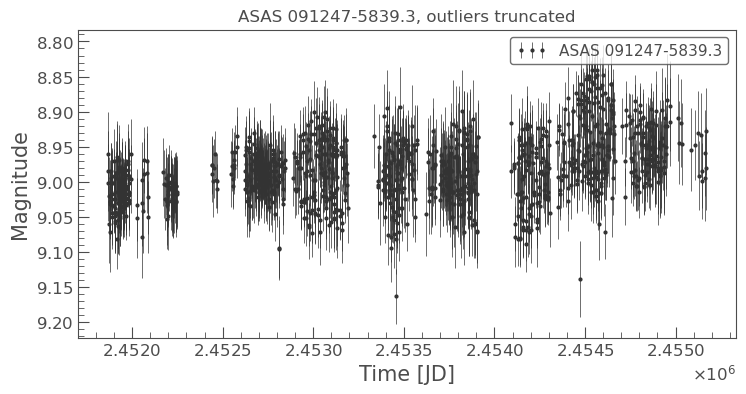

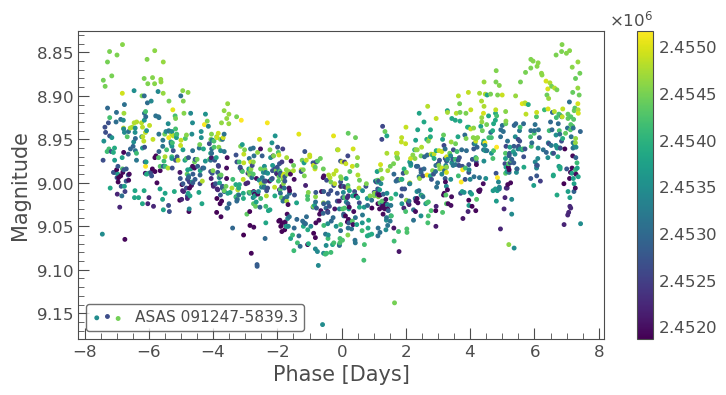

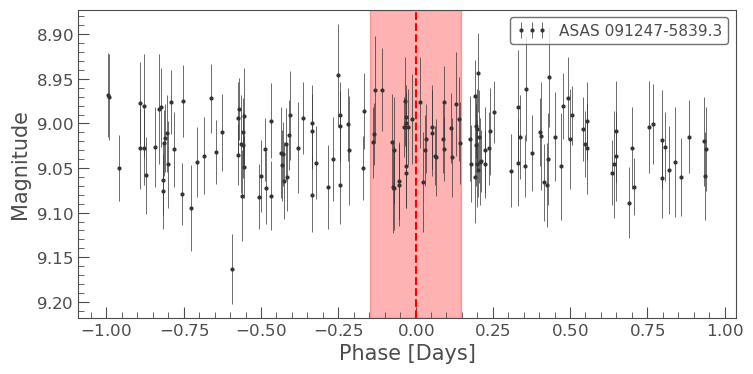

In [16]:
import lightkurve_ext_readers as lker

_lc = lker.read_asas3("https://www.astrouw.edu.pl/cgi-asas/asas_cgi_get_data?091247-5839.3,asas3")
ax = tplt.errorbar(_lc);
ax.set_title(_lc.label + ", all");

# lots of data points much fainter than the expected range, especially before HJD 2453000
_lc = _lc.truncate(None, 9.2, column="flux") 
ax = tplt.errorbar(_lc);
ax.set_title(_lc.label + ", outliers truncated");

_lc_f = _lc.fold(period=14.91, epoch_time=2453069.6, wrap_phase=None)  # initial epoch / period from existing VSX entry
ax = tplt.scatter(_lc_f, s=25, c=_lc_f.time_original.value);

ax = tplt.errorbar(_lc_f.truncate(-1, 1));
ax.axvline(0, color="red", linestyle="--");
ax.axvspan(-7/24/2, 7/24/2, color="red", alpha=0.3);

# use the outlier-truncated version
lc_asas3 = _lc 

## ASAS-SN data (not useful)

- the (saturated) ASAS-SN data does not appear to have the photometric precsison needed

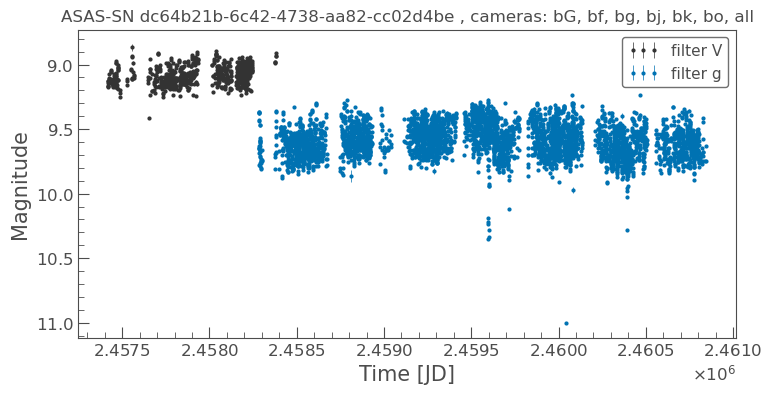

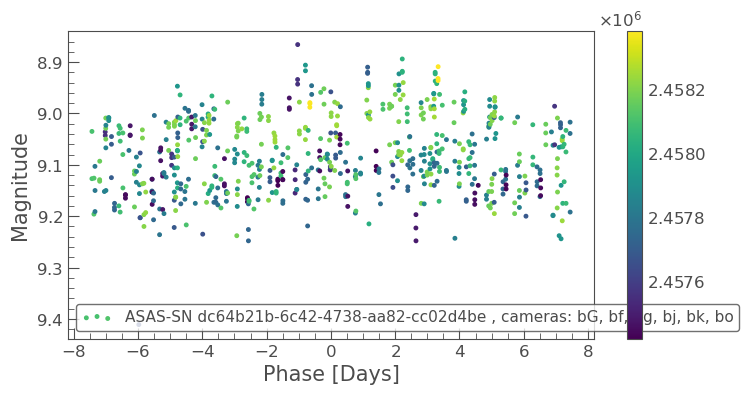

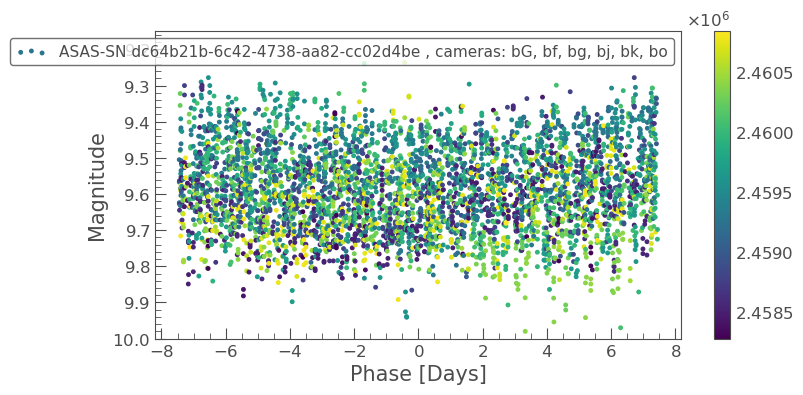

In [233]:
# See if ASAS-SN data is usable despite satuartion
# not too useful. one could barely see rotational varaiability in g

import lightkurve_ext_readers as lker

_lc = lker.read_asas_sn_csv(f"{lk_download_dir}/targets/tic385464250_asas_sn_light_curve_dc64b21b-6c42-4738-aa82-cc02d4be9c12.csv")
_lc = _lc.select_flux("mag")
ax = tplt.errorbar_partition_by(_lc, "filter");
ax.set_title(_lc.label + ", all");

_lc_f = _lc.fold(period=14.91, epoch_time=2453069.6, wrap_phase=None)  # initial epoch / period from existing VSX entry

for filt in ["V", "g"]: 
    _lc_f_cur = _lc_f[_lc_f.filter == filt]
    ax = tplt.scatter(_lc_f_cur, s=25, c=_lc_f_cur.time_original.value);
    if filt == "g":
        ax.set_ylim(10, None)  # truncate some outliers


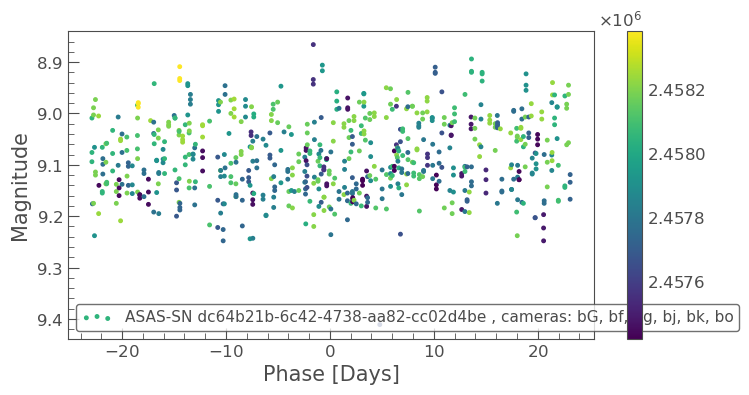

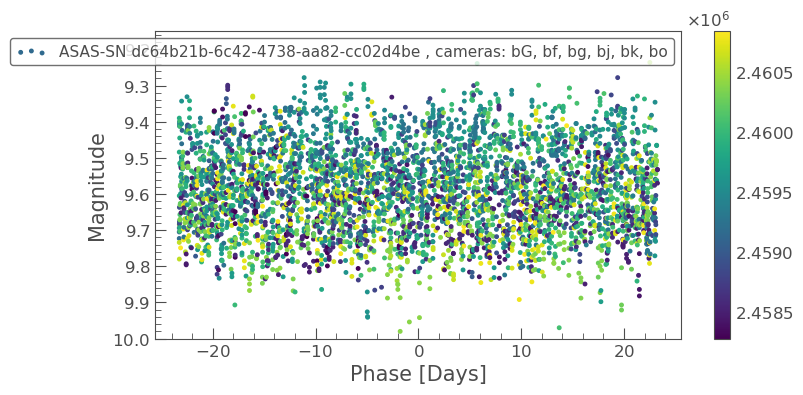

In [237]:
_lc_f = _lc.fold(period=46.5153, epoch_time=2458581.41, wrap_phase=None)  # EA period/epoch identified from TESS

for filt in ["V", "g"]: 
    _lc_f_cur = _lc_f[_lc_f.filter == filt]
    ax = tplt.scatter(_lc_f_cur, s=25, c=_lc_f_cur.time_original.value);
    if filt == "g":
        ax.set_ylim(10, None)  # truncate some outliers

## Gaia DR3 info (coordinate, etc.)

In [18]:
# reload(lke)
# reload (lket)
rs_all_cols, rs, rs_html  = lket.search_gaiadr3_of_tics(tic, radius_arcsec=5, magnitude_range=None,  pm_error_factor=None, pm_range_fraction=None, pm_range_minimum=None, 
                                                        calc_separation_from_first_row=True,  # assuming the first row is the target, it'd calculate more accurately the separation for Gaia DR3 Main
                                                        compact_columns=True, also_return_html=True, also_return_astrophysical=False, verbose_html=True, include_nss_summary_in_html=False)
display(HTML(rs_html))

# from Gaia DR3
target_coord = SkyCoord(rs[0]["RAJ2000"], rs[0]["DEJ2000"], unit=(u.deg, u.deg), frame="icrs")
target_coord_dict = dict(ra=target_coord.ra.value, dec=target_coord.dec.value)


C:\dev\_juypter\PH_TESS_LightCurveViewer\targets\..\lightkurve_ext.py:1972: UserWarning: gaia_dr3_mag_to_vmag(): b_minus_r value (--) is outside the applicable range for the transformation. The result is probably not reliable.
  warnings.warn(


The target is also listed as an astrometric binary with 177.74 d (+/- 1.33 d) period in [Gaia DR3 NSS](https://vizier.cds.unistra.fr/viz-bin/VizieR-4?-ref=VIZ65a1a2351812e4&-source=I%2F357&Source=5483610730803645312)


In [19]:
# primary_name = f"TIC {tic}"
primary_name = "V0845 Car"   # use the name of the existing VSX entry
primary_name

'V0845 Car'

## Combining all data


TESS # data points: 68098
ASAS3 # data points: 1219


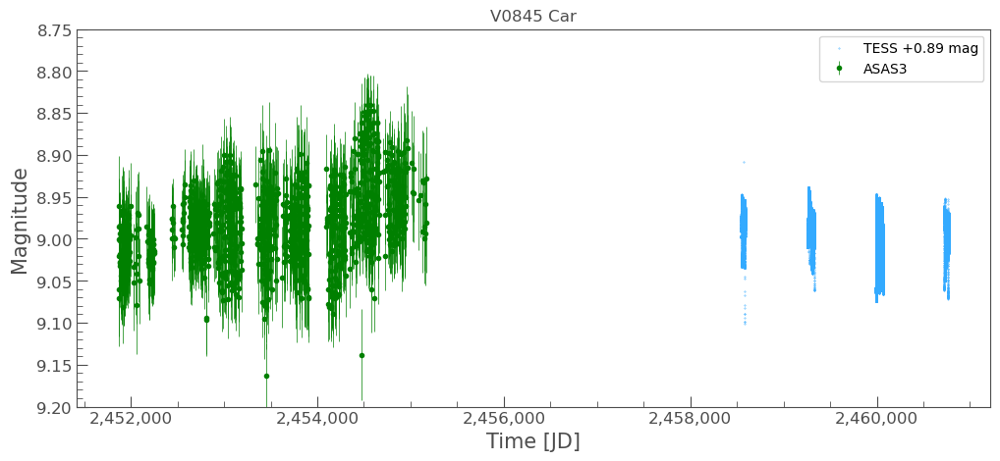

In [35]:
# Convert the data to magnitude and HJD/UTC

import lightkurve_ext_multi_sources as lkem
# reload(lkem)

lc_tess = lke.stitch(lcc_tess, ignore_incompatible_column_warning=True)
lc_tess = lke.to_flux_in_mag_by_normalization(lc_tess)
lc_tess = lke.convert_lc_time_to_hjd_utc(lc_tess, target_coord=target_coord, cache_dir=lk_download_dir)

# axs = tplt.plot_skip_data_gap(lc_tess, figsize=(30,5), s=4, alpha=0.9);

lc_combined_dict = lkem.combine_multi_bands_and_shift(
    {"TESS": lc_tess, 
     "ASAS3": lc_asas3,
    }, 
    shift_to="ASAS3",
)

for k in lc_combined_dict.keys():
    print(f"{k} # data points:", len(lc_combined_dict[k]))

plot_options = lkem.get_default_plot_multi_bands_options_copy()
# for TESS plot (index 0) move it to the front
# plot_options[0][1]["zorder"] = 3  # default 2

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(12, 5), target_name=primary_name, plot_options=plot_options);
ax.set_ylim(9.2, 8.75);


##  Eclipse epoch / period / duration

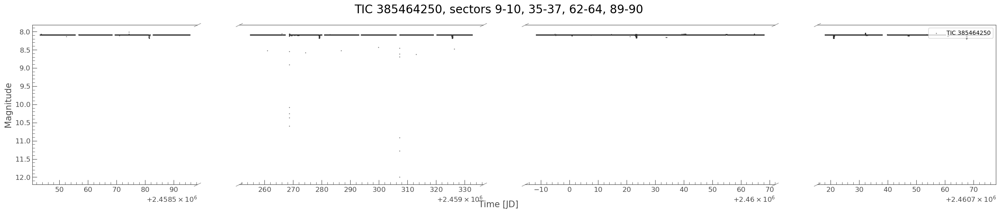

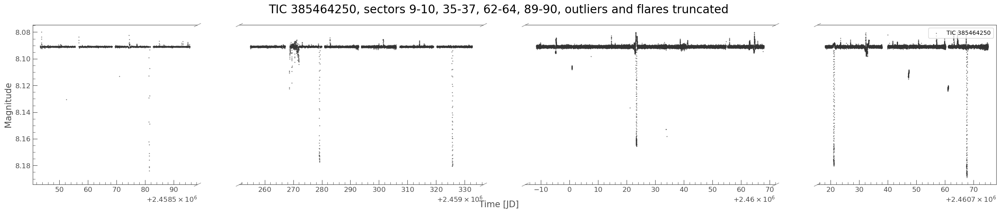

In [43]:
# use detrended QLP data for eclipses
lc_tess_det = lke.stitch(lcc_tess, corrector_func=lambda lc: lke.select_flux(lc, ["det_flux", "kspsap_flux"]).normalize(),  ignore_incompatible_column_warning=True,)
lc_tess_det = lke.convert_lc_time_to_hjd_utc(lc_tess_det, target_coord=target_coord, cache_dir=lk_download_dir, cache_key_suffix="det")
lc_tess_det = lke.to_flux_in_mag_by_normalization(lc_tess_det)

axs = tplt.plot_skip_data_gap(lc_tess_det, figsize=(30,5), s=1, alpha=0.9);
axs[0].get_figure().suptitle(f"{lc_tess_det.label}, sectors {lke.abbrev_sector_list(lc_tess_det)}", fontsize=20);


lc_tess_det_all = lc_tess_det  # keep a copy before truncateion
lc_tess_det = lc_tess_det.truncate(8.08, 8.2, column="flux")  # remove outliers and flares

axs = tplt.plot_skip_data_gap(lc_tess_det, figsize=(30,5), s=1, alpha=0.9);
axs[0].get_figure().suptitle(f"{lc_tess_det.label}, sectors {lke.abbrev_sector_list(lc_tess_det)}, outliers and flares truncated", fontsize=20);


### Initial epoch / period / duration


In [57]:
lc_tess_det_n = lke.to_normalized_flux_from_mag(lc_tess_det)

lc_tess_det_n.interact_bls();

C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\erfa\core.py:133: ErfaWarning: ERFA function "taiutc" yielded 15 of "dubious year (Note 4)"
  warn(f'ERFA function "{func_name}" yielded {wmsg}', ErfaWarning)
ERROR:bokeh.server.protocol_handler:error handling message
 message: Message 'PATCH-DOC' content: {'events': [{'kind': 'ModelChanged', 'model': {'id': 'p1968'}, 'attr': 'value', 'new': 2900}]} 
 error: TypeError("Unsupported operand type(s) for ufunc add: 'Time,Quantity'")
Traceback (most recent call last):
  File "C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\astropy\units\quantity_helper\converters.py", line 196, in converters_and_unit
    if can_have_arbitrary_unit(args[i]):
  File "C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\astropy\units\quantity_helper\converters.py", line 138, in can_have_arbitrary_unit
    return np.all(np.logical_or(np.equal(value, 0.0), ~np.isfinite(value)))
TypeError: ufunc 'isfinite' no

interact BLS result
Period: 46.5157505 days, T0: 2458581.371334

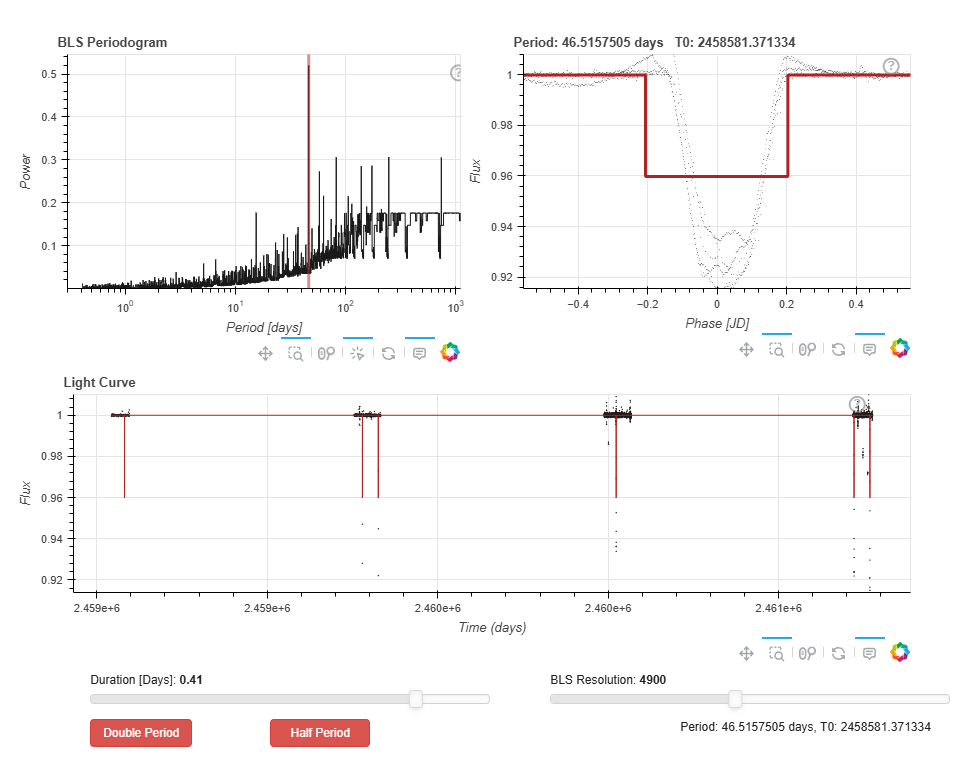

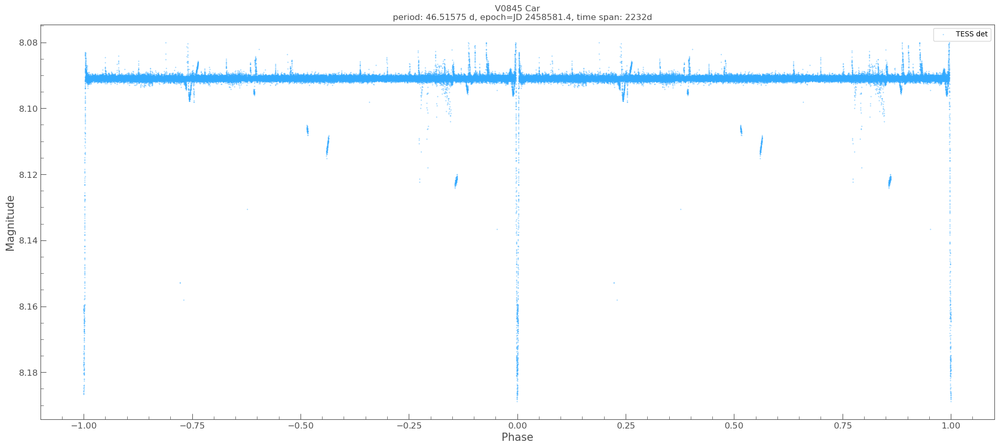

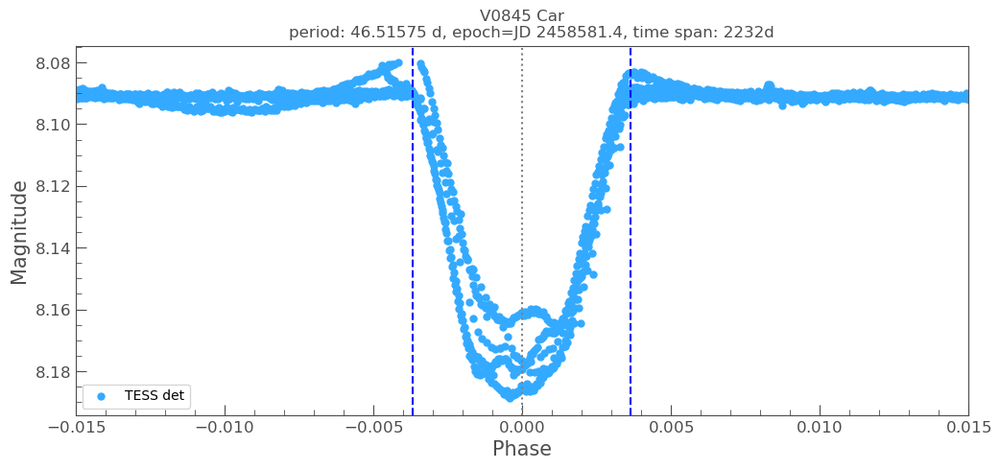

In [72]:
# Cannot tell the difference between TCE period and BLS period, cut 1 digit and choose the best
period_trial = 46.51575  # interact_bls
epoch_time_hjd_trial = 2458581.37 + 0.03 # interact_bls + adjustment from visua inspection

duration_hr_min_i_trial = 8.2

# No Min II
# epoch_phase_min_ii_trial   = abs(epoch_time_min_ii_btjd_trial   - epoch_time_btjd_trial  ) / period_trial   % 1
# if epoch_phase_min_ii_trial   > 0.5:
#     epoch_phase_min_ii_trial   = epoch_phase_min_ii_trial   - 1
# epoch_phase_min_ii_trial  = round(epoch_phase_min_ii_trial  , 3)  # precsion from eyeballing zoomed plot

# print("Adopted period / epoch / duration_hr: ", period_trial, epoch_time_hjd_trial, duration_hr_min_i_trial, duration_hr_min_ii_trial)
# print("Min II phase:", epoch_phase_min_ii_trial)

# --- Plot them to verify ---

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_trial,
    epoch=Time(epoch_time_hjd_trial   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    # plot_options=plot_options,
);


# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 25
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_trial  ,
    epoch=Time(epoch_time_hjd_trial   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_i_trial  ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ylim = (None, None)
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.015, 0.015);  # to see primary in details



In [304]:
period_final * 0.7 / 100 * 24, duration_hr_min_i_final

(7.814570399999999, 8.2)

### Refine the period with MCMC on primary eclipses

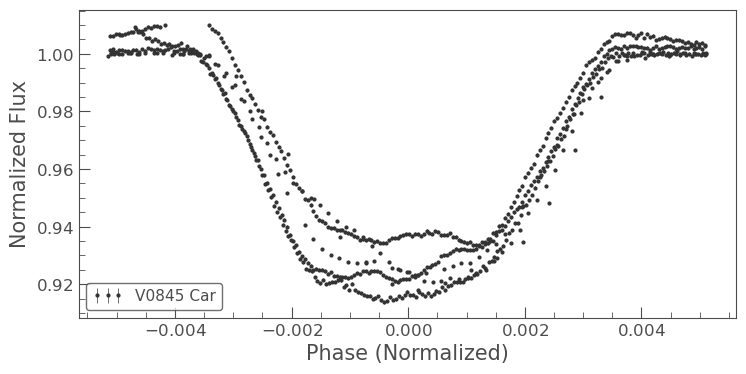

In [73]:
# reload(lke)

# a single normalized lightcurve
lc = lc_tess_det_n.remove_nans()
lc.meta["LABEL"] = primary_name
# tplt.scatter(lc);

lc_f_min_i = lc.fold(epoch_time=epoch_time_hjd_trial, period=period_trial, normalize_phase=True)
lc_f_min_i = lc_f_min_i.truncate((0 - duration_hr_min_i_trial / 24 * 0.7) / period_trial, (0 + duration_hr_min_i_trial /24 * 0.70) / period_trial)
# ax1 = tplt.scatter(lc_f_min_i, c=lc_f_min_i.time_original.value, s=25);
ax1 = tplt.errorbar(lc_f_min_i);



In [74]:
from types import SimpleNamespace

import sys
if "../eb_with_diff_sb_period/etv/" not in sys.path:  # for etvp
    sys.path.append("../eb_with_diff_sb_period/etv/")

import etv_functions_with_period as etvp
import etv_functions
# reload(etv_functions)

lc_f = lc_f_min_i

# # median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# # t0 in normalixed phase
start_vals = [1.0, -0.075, 0, 0.0016, 3.0]


# convert lc to the form needed by fit etv_functions
lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
etv_functions.plot_initial_guess_interactive(lc_f_data, None, None, None, "0", *start_vals)

Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

100%|██████████████████████████████████████████████████████████| 4000/4000 [01:49<00:00, 36.39it/s]
N/20 = 200;
tau: [147.27426368 230.23473578 111.22227323 230.58294861 251.15776864
 104.32905598]


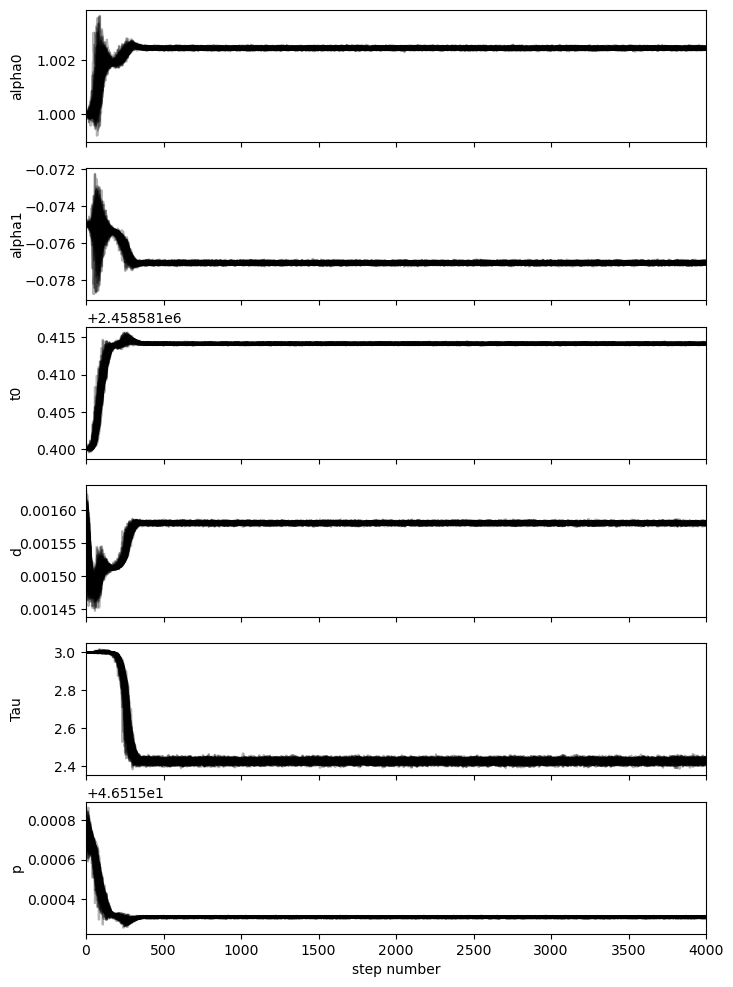

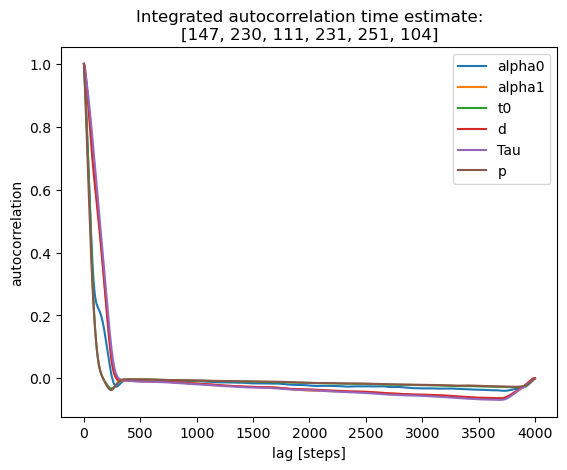

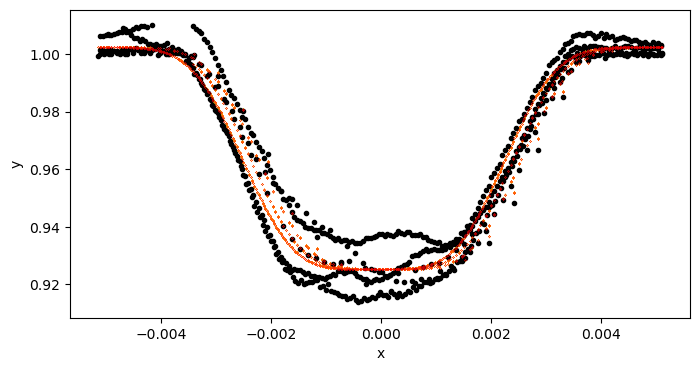

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.002446830600405, -0.07705919855186077, 2458581.414161038, 0.001580443029755615, 2.4255901440475327, 46.515311002012005
std_p: 2.0140279302005617e-06


In [76]:
mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats  = etvp.run_mcmc_initial_fit_p(
    lc_f_data, 
    [1.0, -0.075, epoch_time_hjd_trial, 0.0016, 3.0, period_trial],
    # nruns=20, discard=1,
    nruns=4000, discard=1000,
    # nruns=5000, discard=4000,
    autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient    
    pool=-2, 
    plot_chains=True, plot_autocorrelation=True, plot=True, 
    also_return_stats=True,
)

print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
print("std_p:", fit_params_p_stats["std_p"])


In [78]:
print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
print("std_t0:", fit_params_p_stats["std_t0"])
print("std_p:", fit_params_p_stats["std_p"])


mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.002446830600405, -0.07705919855186077, 2458581.414161038, 0.001580443029755615, 2.4255901440475327, 46.515311002012005
std_t0: 6.759659090885536e-05
std_p: 2.0140279302005617e-06


### Final epoch / period / duration


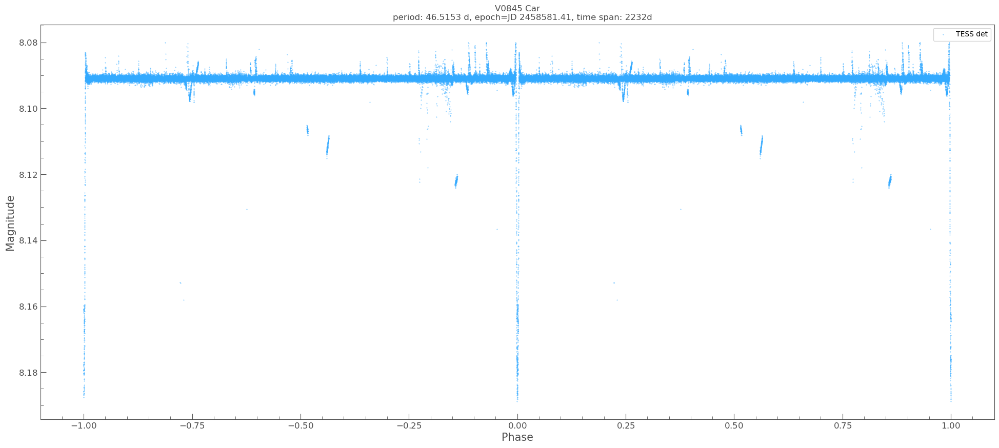

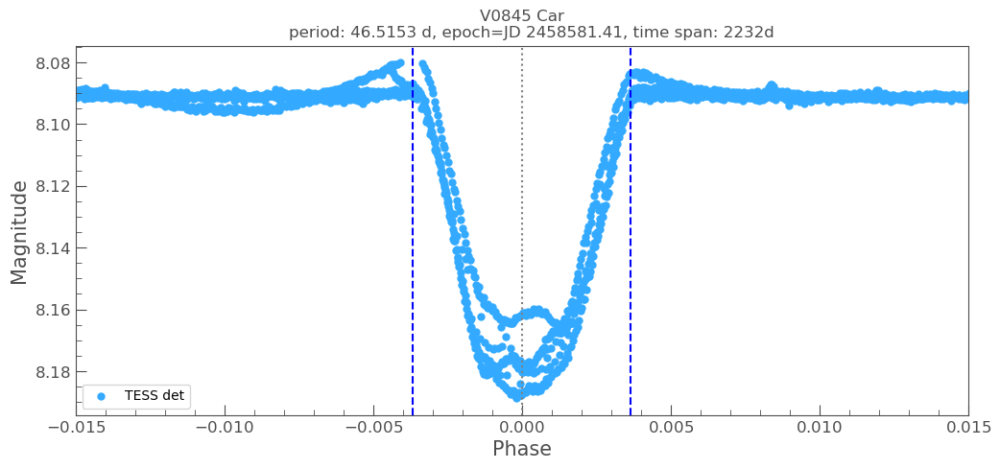

In [297]:
# Cannot tell the difference between TCE period and BLS period, cut 1 digit and choose the best
period_final = 46.5153   # from MCMC
epoch_time_hjd_final = 2458581.41  # from MCMC

duration_hr_min_i_final = duration_hr_min_i_trial


# --- Plot them to verify ---

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_final,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    # plot_options=plot_options,
);
ylim = (None, None)
ax.set_ylim(*ylim);


# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 25
ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_final  ,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    duration_hr=duration_hr_min_i_final  ,  # for plotting only
    figsize=(12, 5),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.015, 0.015);  # to see primary in details


## Rotation epoch / period

### Rotation period trial / refinement

#### Trial with Lomb-Scargle, ANOVA and visual inspection of candidate periods

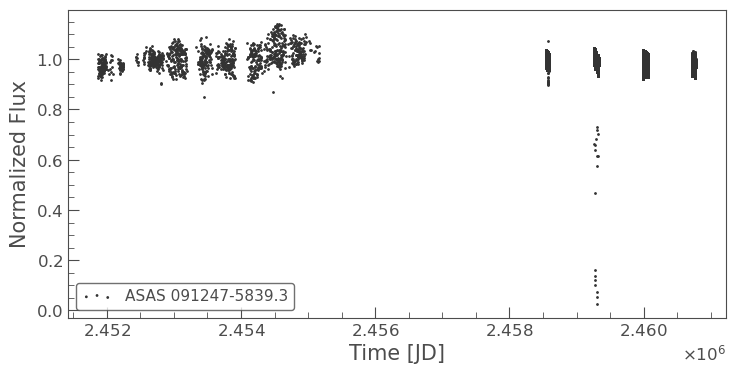

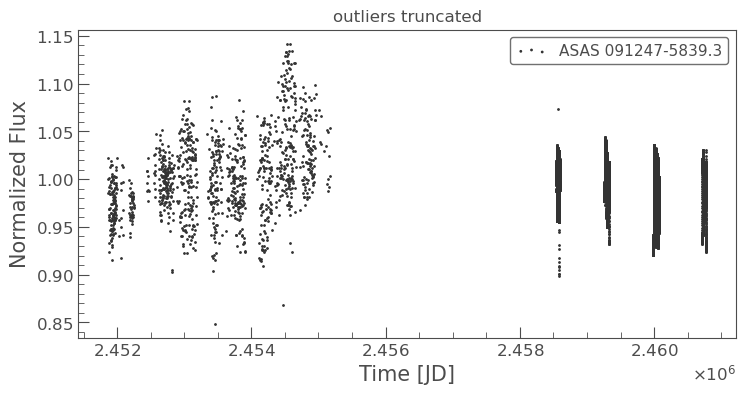

In [135]:
lc = lke.stitch_lc_dict(lc_combined_dict).remove_nans().remove_nans(column="flux_err")
tplt.scatter(lc)

lc = lc.truncate(0.8, None, column="flux")
ax = tplt.scatter(lc);
ax.set_title("outliers truncated");


In [139]:
pg = (
    lc
    # lke.to_normalized_flux_from_mag(lc_tess)
    .to_periodogram(method="lombscargle",
                    # use the frequency grid from TESS data only (otherwise we hit some IndexError from lightkurve / astropy)
                    frequency=u.Quantity(np.linspace(8.96e-5, 215.99, num=2410189), unit=1/u.d),
                    # minimum_frequency=0.01 * 1 / u.d, maximum_frequency=1.9999 * 1 / u.d, 7
                    # minimum_period=0.5, maximum_period=100,
                    # oversample_factor=50,  # default: 5
                      )
     )
print(len(lc), lc.time.max() - lc.time.min(), lc.time.min(), lc.time.max(), )
pg.show_properties();

print("period_at_max_power:", pg.period_at_max_power, "/", pg.frequency_at_max_power.to(u.microhertz))


69299 8906.271835869959 2451868.80525 2460775.077028
lightkurve.Periodogram properties:
      Attribute                   Description            Units
---------------------- --------------------------------- -----
                nterms                                 1      
              targetid                         385464250      
          default_view                         frequency      
                 label                ASAS 091247-5839.3      
             ls_method                              fast      
frequency_at_max_power                            0.0661 1 / d
             max_power                            0.0274      
               nyquist                          215.9827 1 / d
   period_at_max_power                           15.1203     d
             frequency                  array (2410189,) 1 / d
                period                  array (2410189,)     d
                 power                  array (2410189,)      
                  meta <class 

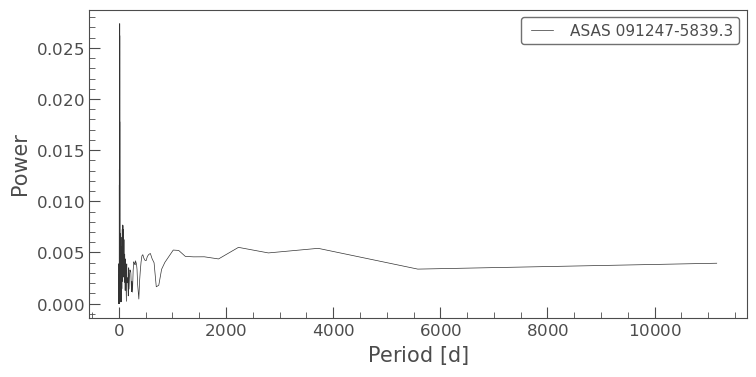

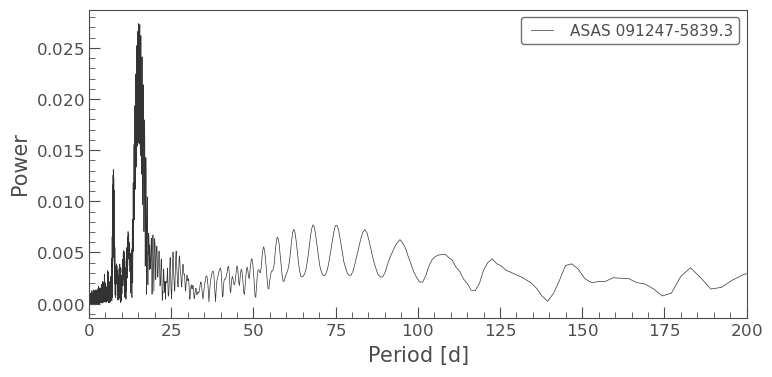

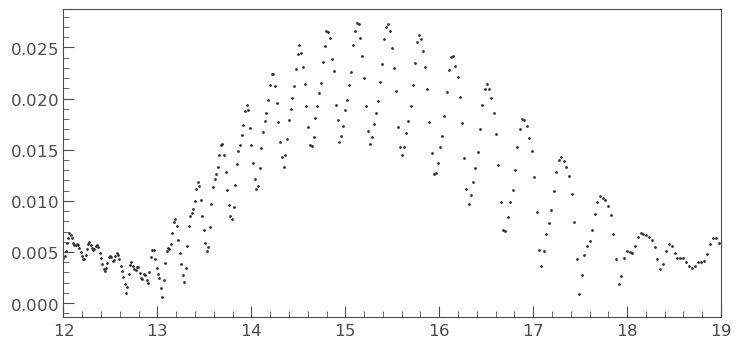

In [152]:
ax = pg.plot(view="period"); 

ax = pg.plot(view="period"); 
ax.set_xlim(0, 200);

ax = tplt.lk_ax()
ax.scatter(pg.period.value, pg.power.value, s=1);
ax.set_xlim(12, 19);

In [154]:
# reload(lke_pg)
peaks = lke_pg.find_peaks(
    pg, 
    # pg[pg.frequency < 500 * u.microhertz], 
    powerlimit=10**-4,   
)
if "period" not in peaks.columns:
    peaks["period"] = 1 / peaks["frequency"]
    peaks["period"].unit = 1 / peaks["frequency"].unit
if "frequency" not in peaks.columns:
    peaks["frequency"] = 1 / peaks["period"]
    peaks["frequency"].unit = 1 / peaks["period"].unit
peaks["frequency_u"] = u.Quantity(peaks["frequency"]).to(u.microhertz)  # in microhertz, for log scale plot
peaks["period_h"] = u.Quantity(peaks["period"]).to(u.hour)  # period in hours
peaks["rank"] = np.linspace(1, len(peaks), len(peaks), dtype=int)

peaks[peaks["period"] > 0][:15]
# peaks[peaks["frequency"] > 100][:15]  # in 1/d
# peaks[peaks["frequency_u"] > 200][:15]
# peaks[peaks["frequency_ratio"] < 5][:15]
# peaks[(1.4 < peaks["period"]) & (peaks["period"] < 1.6)][:15]
# peaks[(100 < peaks["frequency_u"]) & (peaks["frequency_u"] < 500)][:15]
# peaks[:15]

power,frequency,prominence,lower_hwhm,upper_hwhm,fwhm,frequency_ratio,period,frequency_u,period_h,rank
,1 / d,,1 / d,1 / d,1 / d,,d,uHz,h,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
0.027370856460344897,0.06613613411468318,0.02721019319682936,-0.0033573,+0.0035515,0.0069088,1.000,15.120327388140844,0.7654645152162405,362.88785731538024,1
0.013104472843225237,0.13540882186319075,0.013024239984168077,-0.0006614,+0.00038596,0.0010474,0.488,7.385043206493164,1.5672317345276707,177.24103695583594,2
0.026195978889743444,0.06335805737444548,0.011713210503210678,-0.0003751,+0.00031109,0.00068619,1.044,15.783312201161882,0.7333108492412672,378.79949282788516,3
0.021391791462832745,0.060579980634207796,0.011701730390917122,-0.00038875,+0.00032786,0.00071661,1.092,16.50710332903818,0.701157183266294,396.17047989691633,4
0.02727942346434783,0.06470228805520566,0.01169643849121809,-0.00033094,+0.00036787,0.00069881,1.022,15.455403974999683,0.7488690747130284,370.9296953999924,5
0.024121222509006467,0.06192421131496797,0.01146736497772187,-0.0003305,+0.00035538,0.00068588,1.068,16.148772487608344,0.7167154087380552,387.5705397026003,6
0.017957671465094246,0.059235749953447624,0.010915661524919705,-0.00044227,+0.00029221,0.00073448,1.116,16.88169729911216,0.6855989577945327,405.1607351786919,7
0.026597839472418148,0.06756998017416069,0.010880410298986329,-0.00040016,+0.0003005,0.00070065,0.979,14.799471561520573,0.7820599557194524,355.1873174764937,8


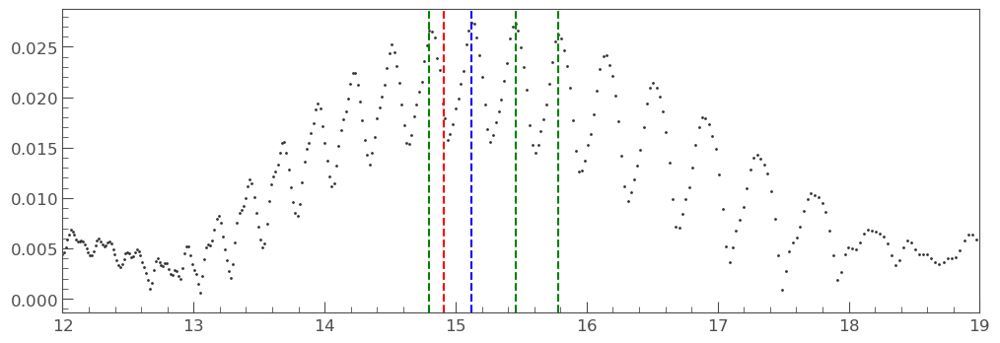

In [158]:
ax = tplt.lk_ax(figsize=(12, 4))
ax.scatter(pg.period.value, pg.power.value, s=1);
ax.set_xlim(12, 19);
ax.axvline(pg.period_at_max_power.value, color="blue", linestyle="--");
ax.axvline(14.91, color="red", linestyle="--");  # VSX value
ax.axvline(14.799471, color="green", linestyle="--");  # a sub-peak 
ax.axvline(15.455404, color="green", linestyle="--");  # a sub-peak 
ax.axvline(15.783312, color="green", linestyle="--");  # a sub-peak 



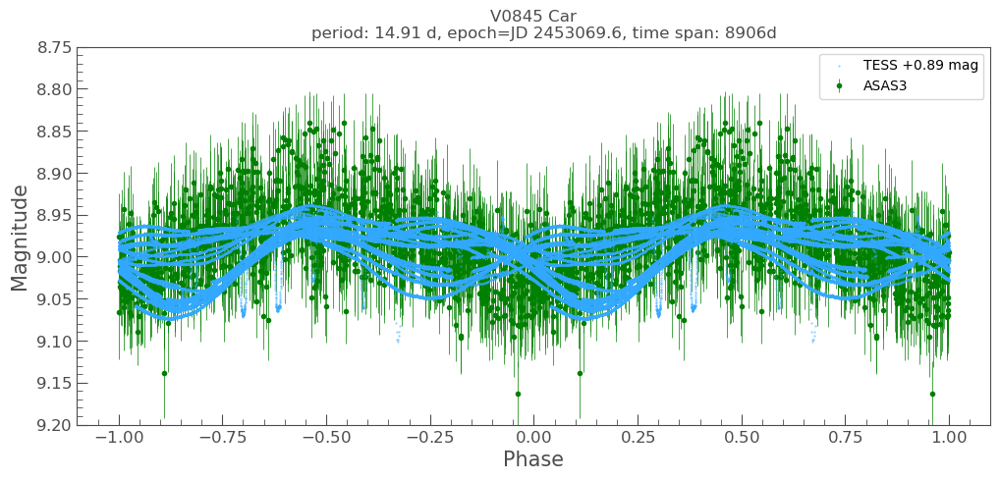

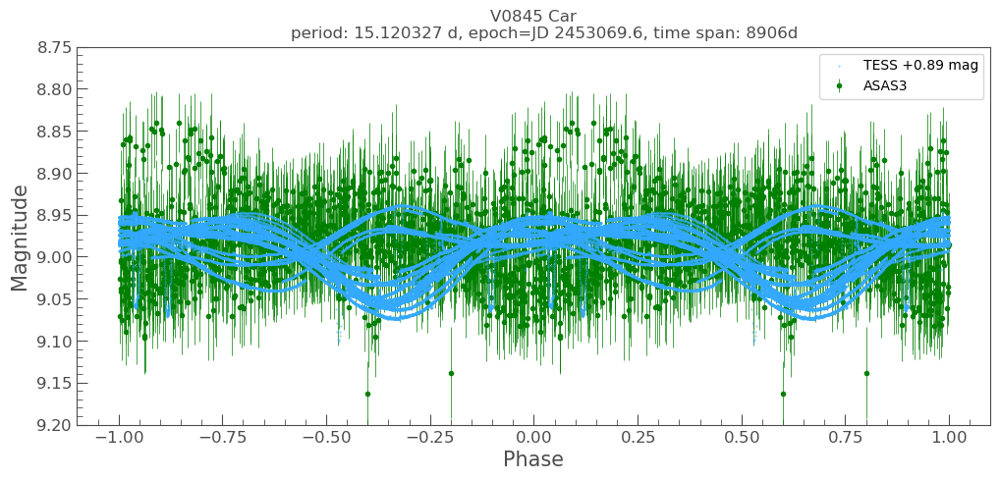

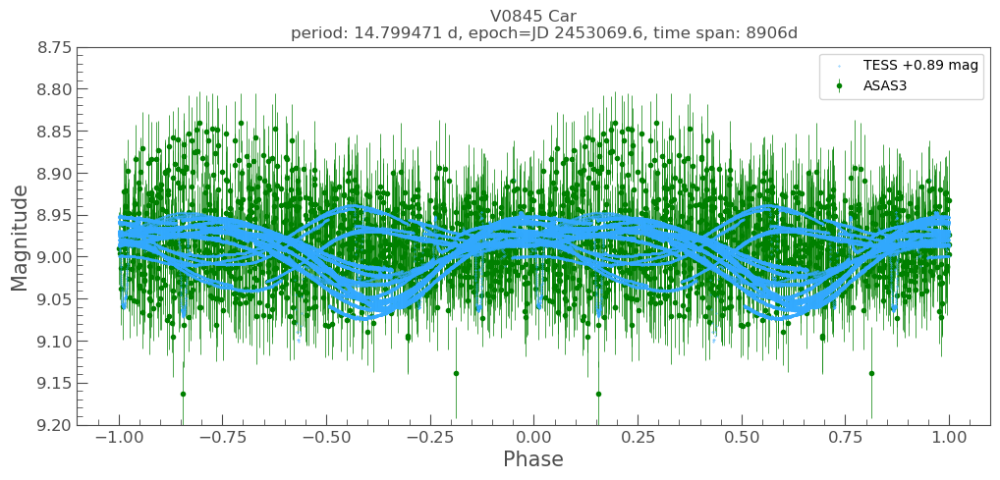

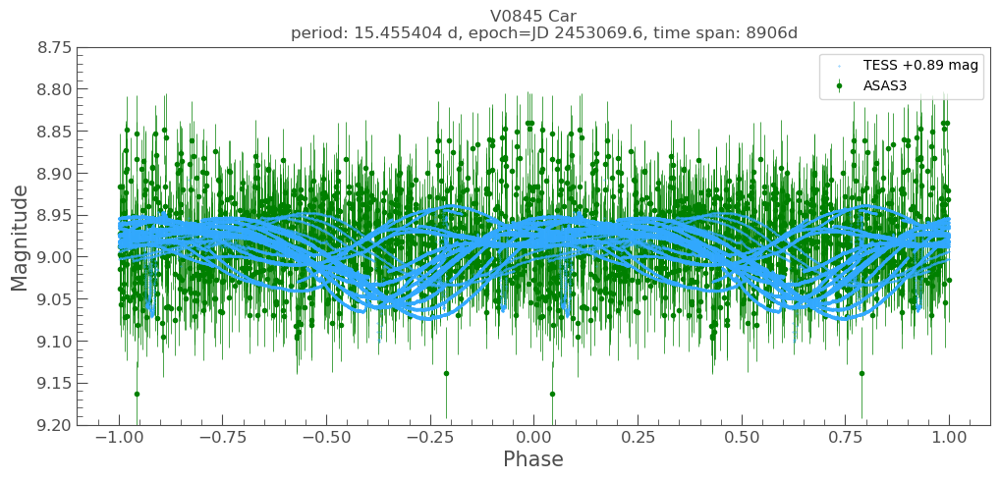

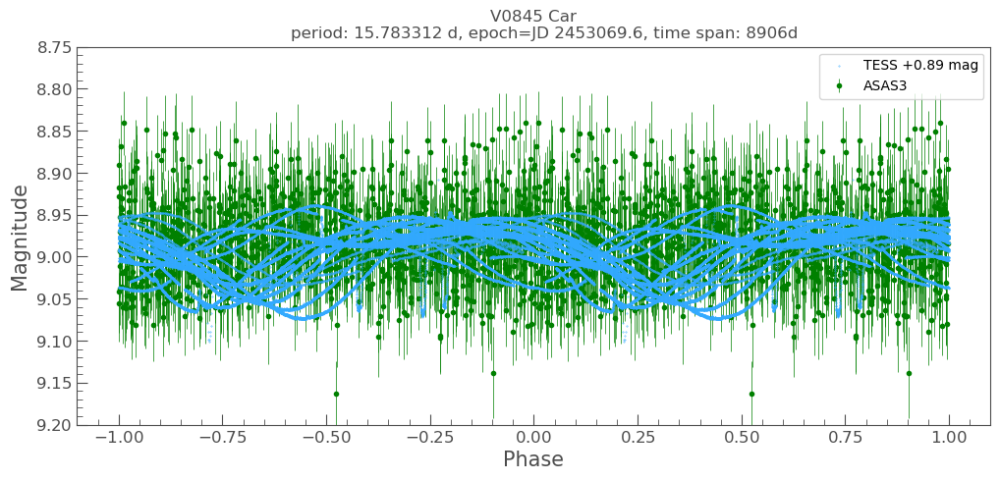

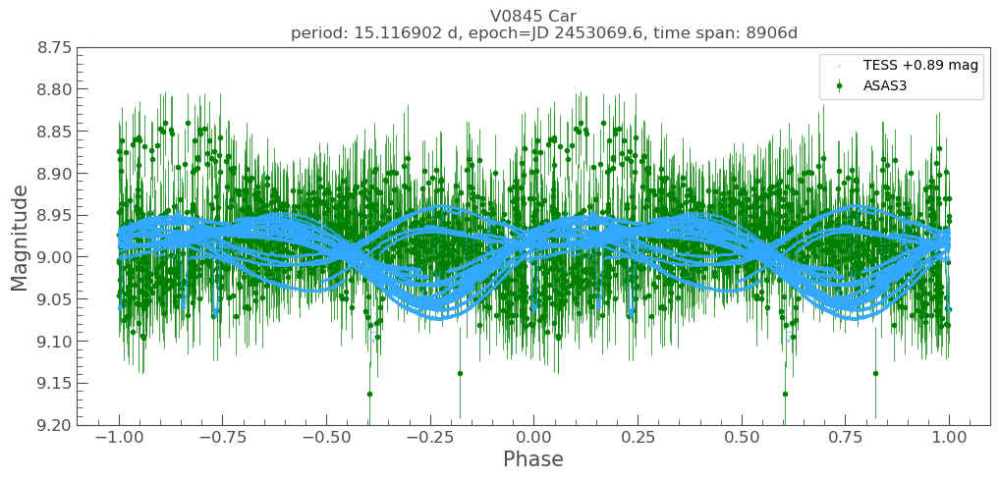

In [232]:
plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 9  # push TESS data to the top

for rot_period_trial in [ 
    14.91,  # VSX value
    15.120327,  # LombScargle peak
    14.799471,  # a LS sub-peak 
    15.455404,  # a LS sub-peak 
    15.783312,  # a LS sub-peak 
    15.116902,  # Muti-band LS peak
]: 
    rot_epoch_time_hjd_trial = 2453069.6  # VSX
    
    ax, lc_f_res = lkem.fold_n_plot_multi_bands(
        lc_combined_dict,
        period=rot_period_trial,
        epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
        phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
        figsize=(12, 5),
        target_name=primary_name,
        plot_options=plot_options,
    );
    ax.set_ylim(9.2, 8.75);



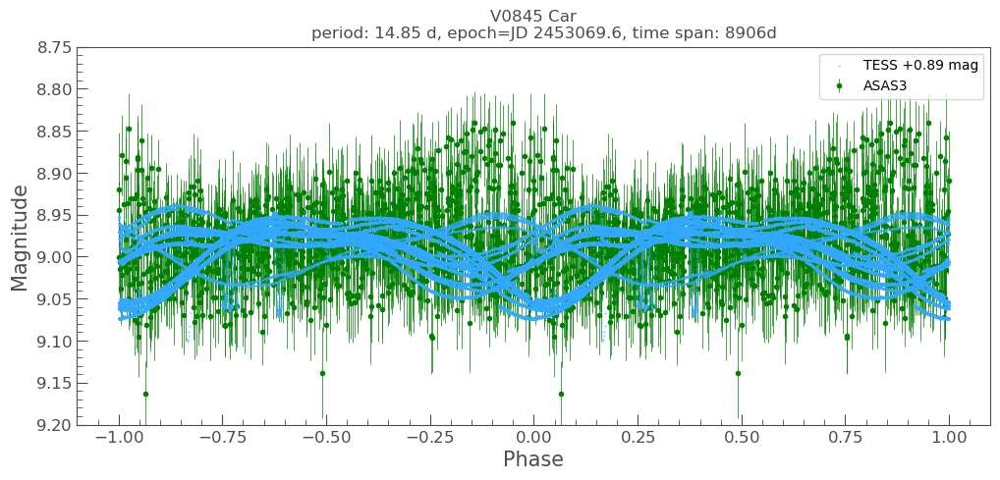

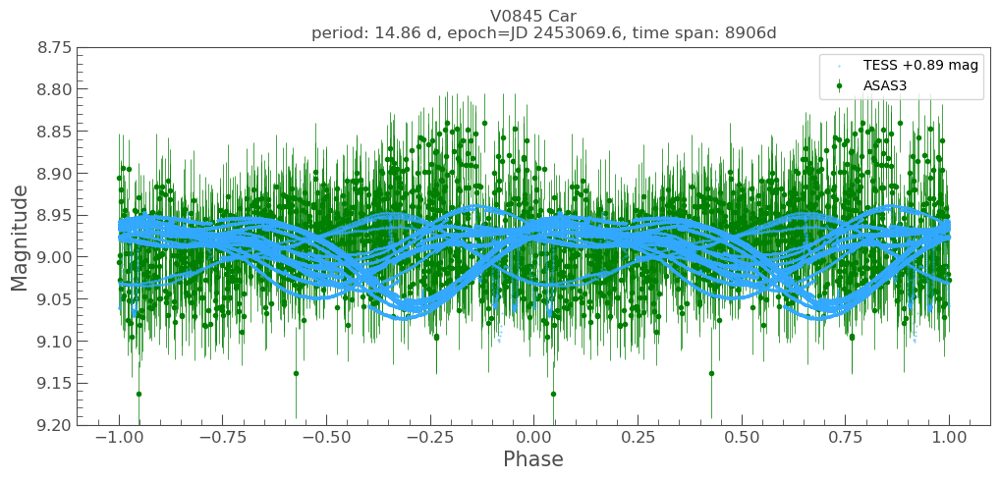

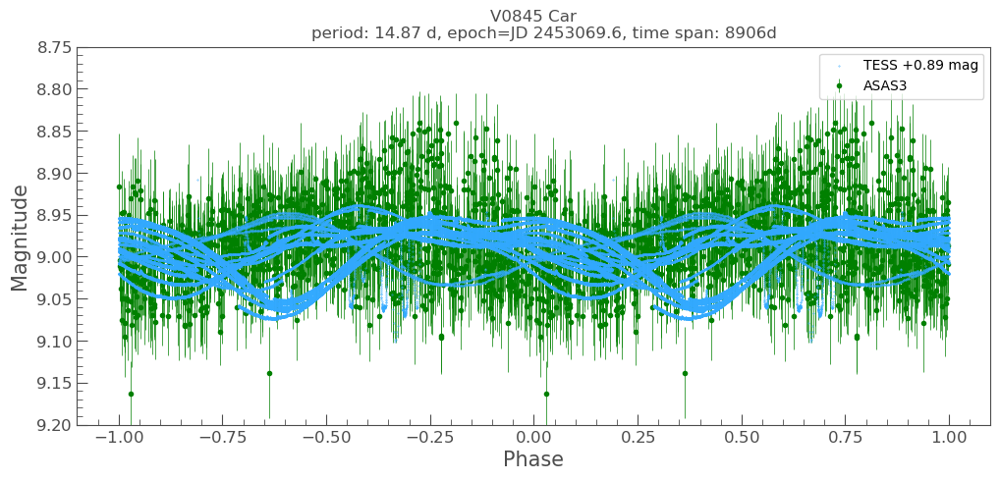

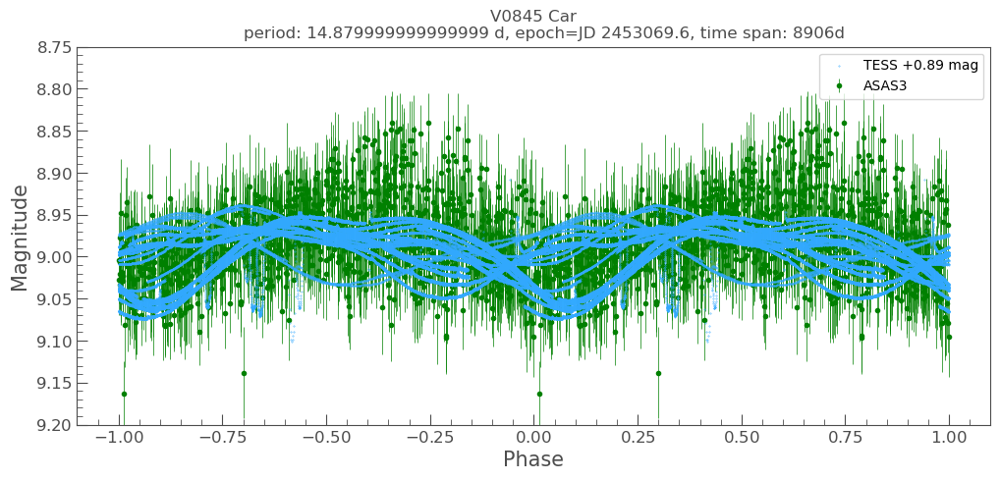

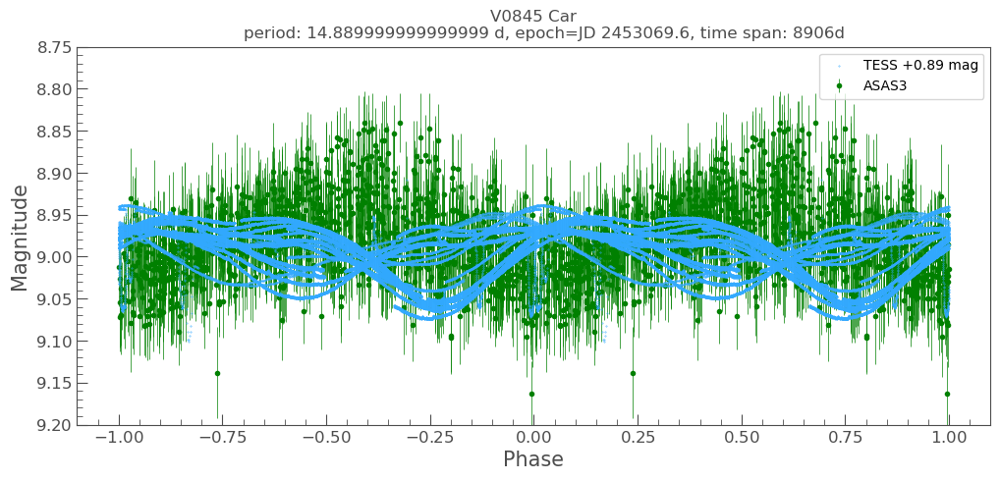

...

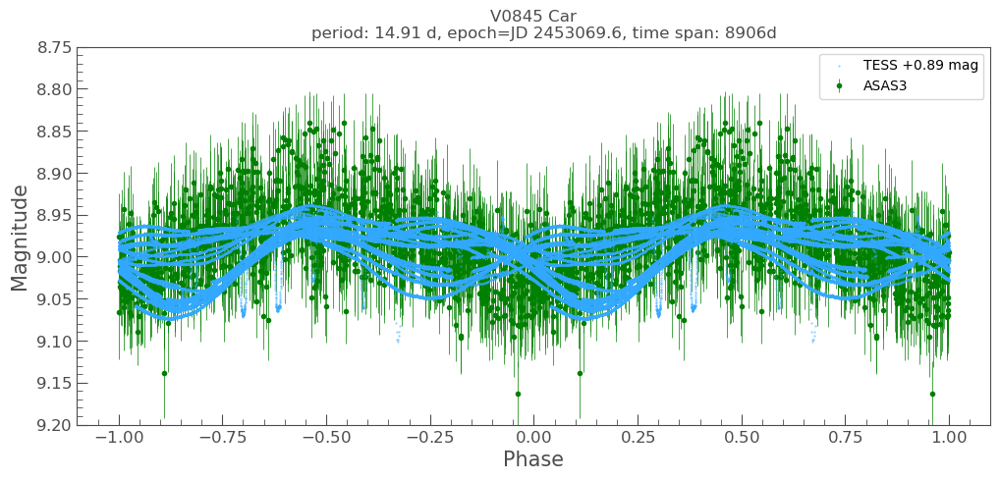

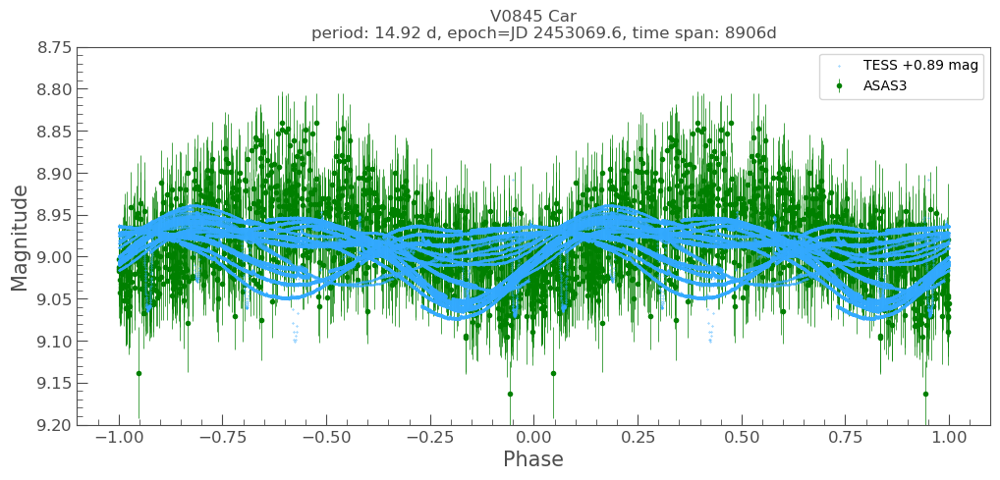

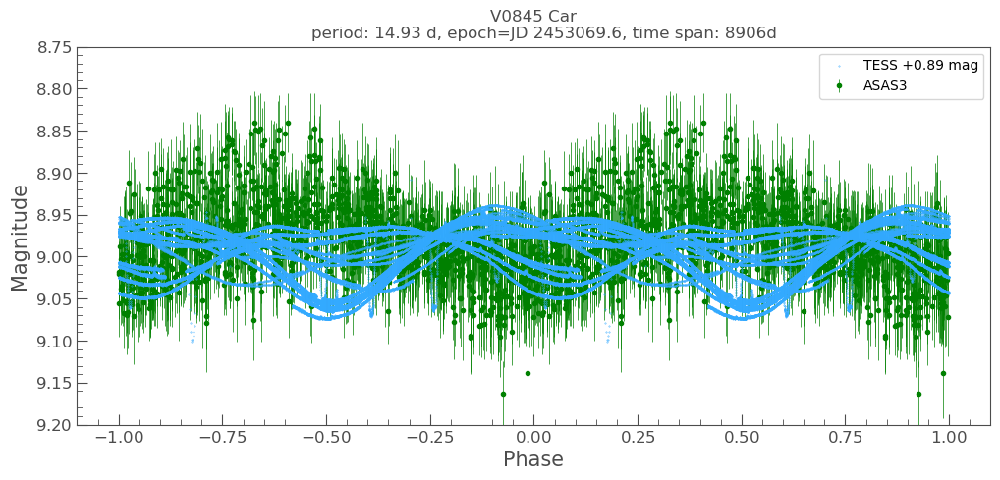

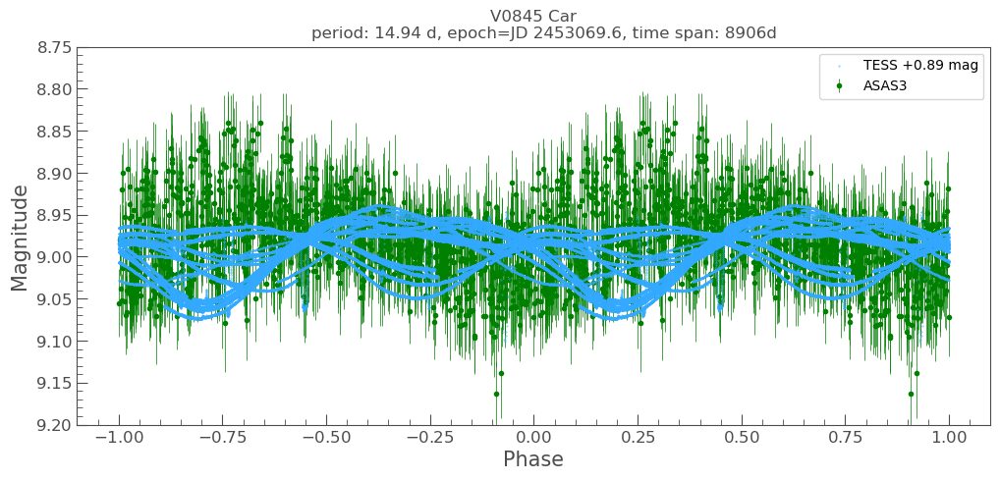

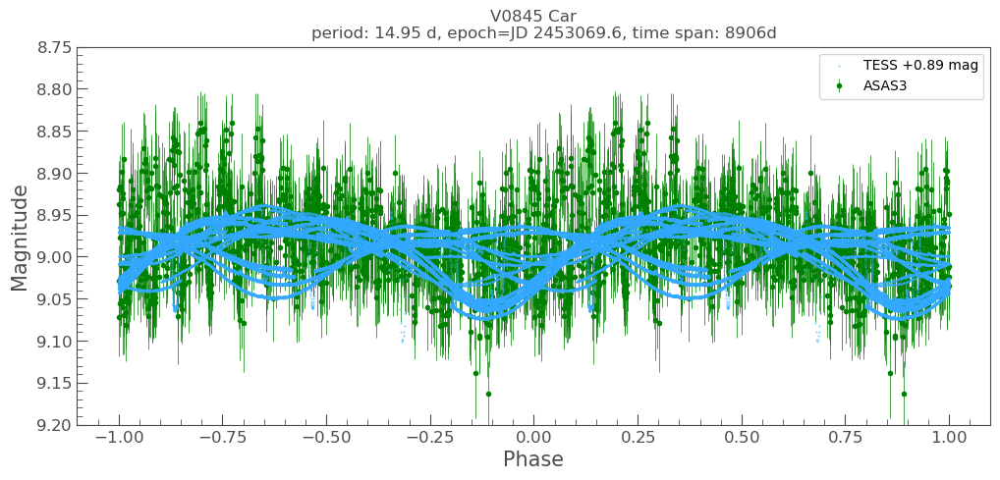

In [167]:
for rot_period_trial in np.linspace(14.85, 14.95, num=11): 
    rot_epoch_time_hjd_trial = 2453069.6  # VSX
    
    ax, lc_f_res = lkem.fold_n_plot_multi_bands(
        lc_combined_dict,
        period=rot_period_trial,
        epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
        phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
        figsize=(12, 5),
        target_name=primary_name,
        plot_options=plot_options,
    );
    ax.set_ylim(9.2, 8.75);


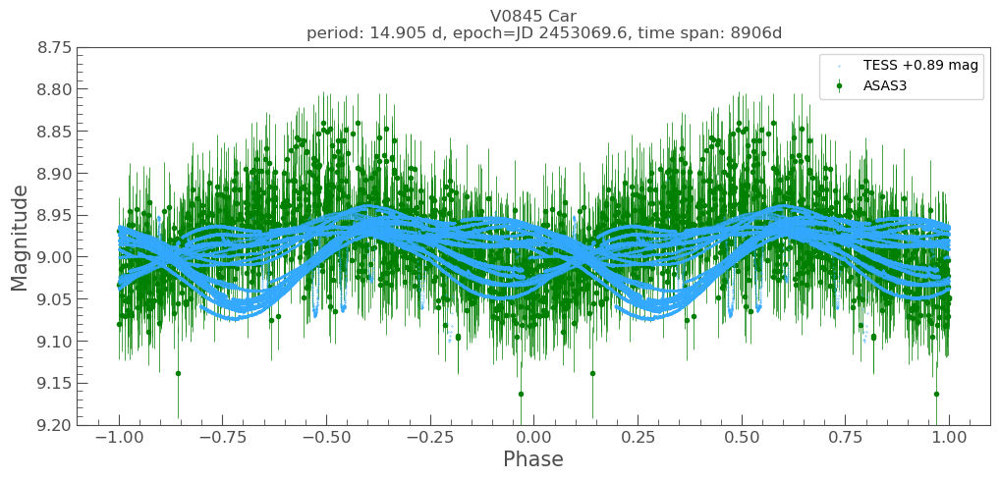

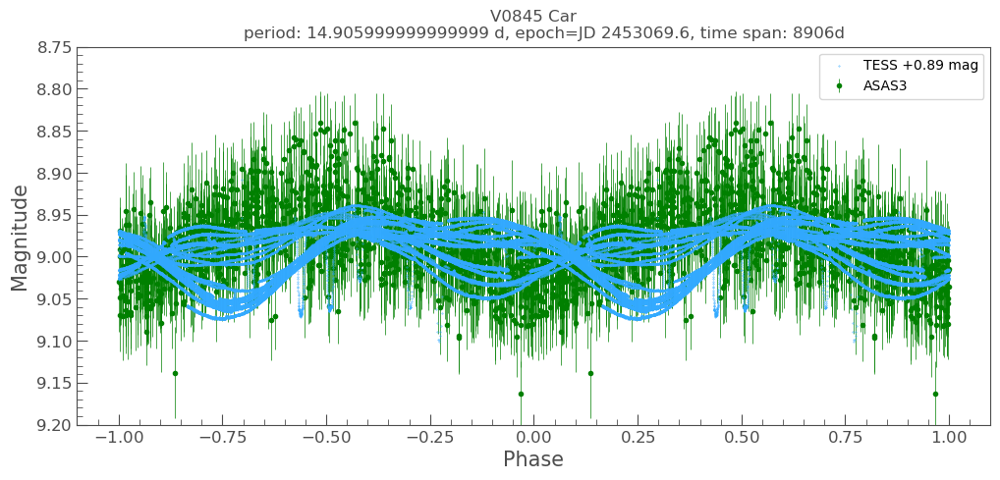

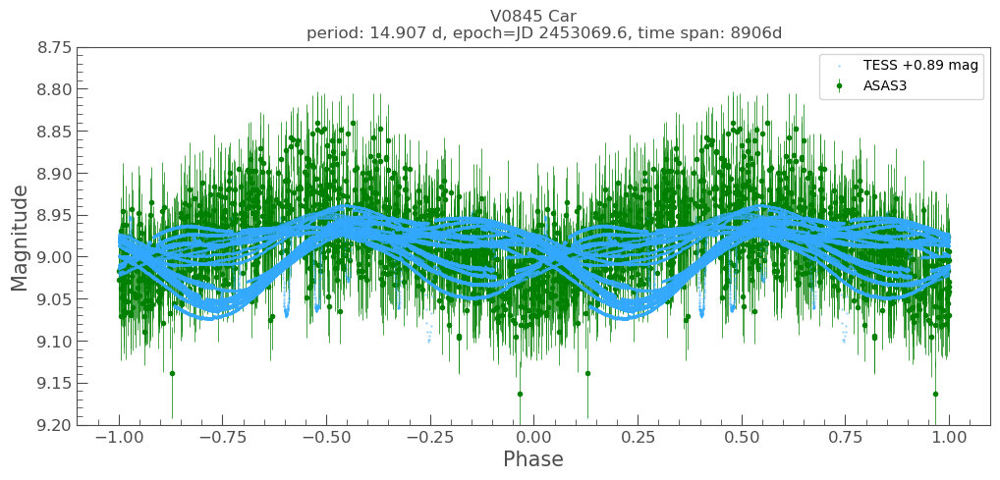

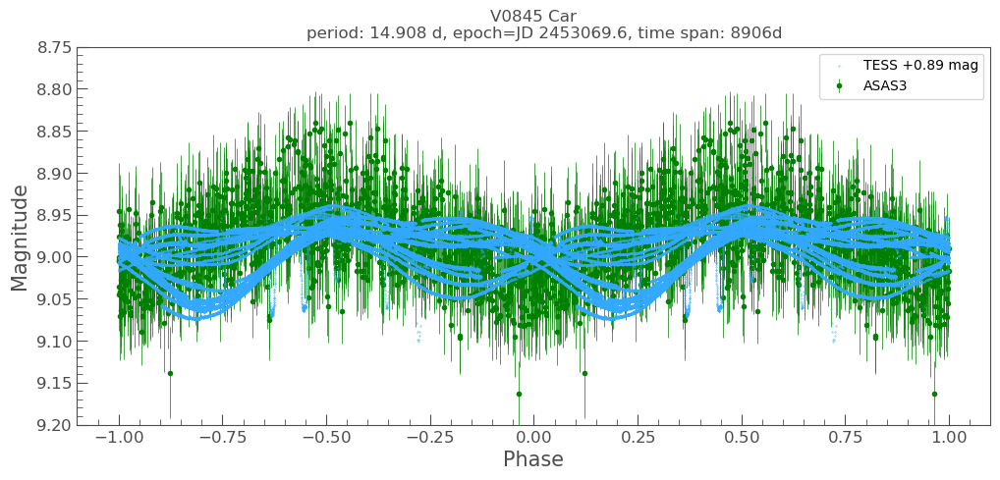

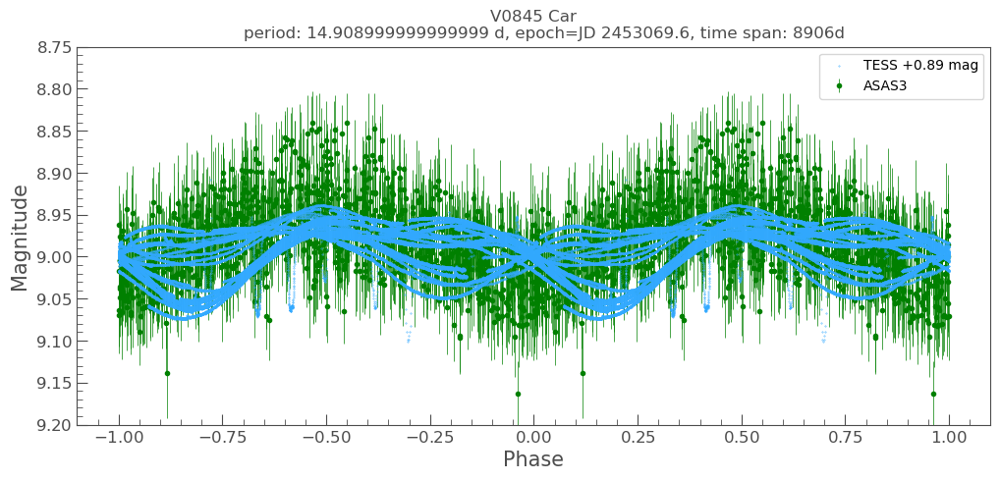

...

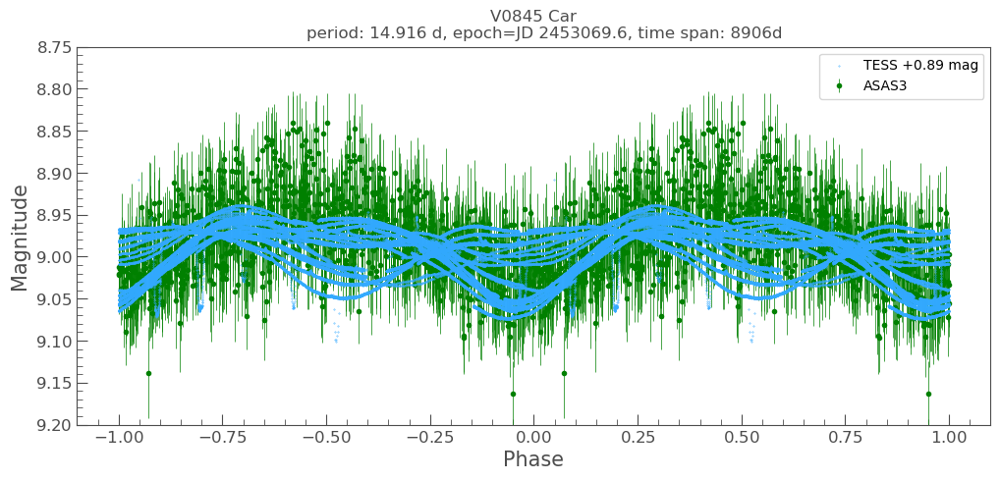

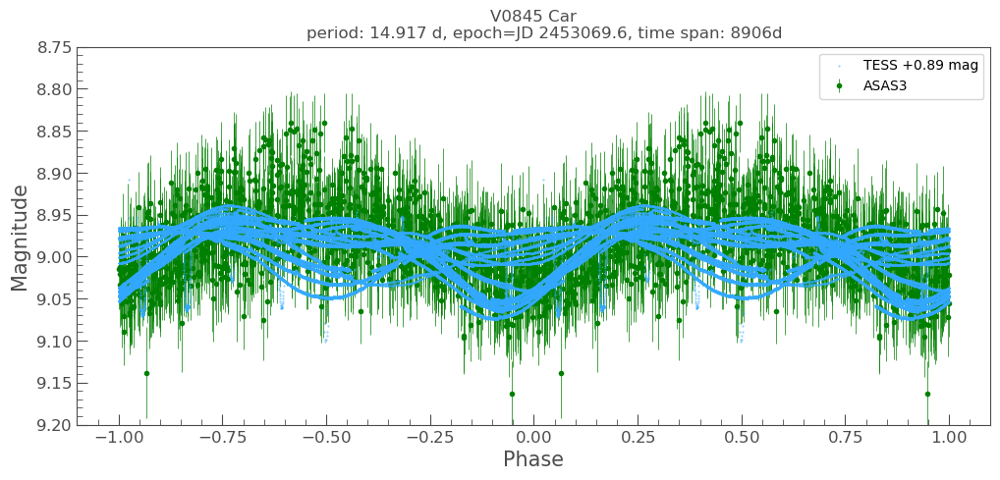

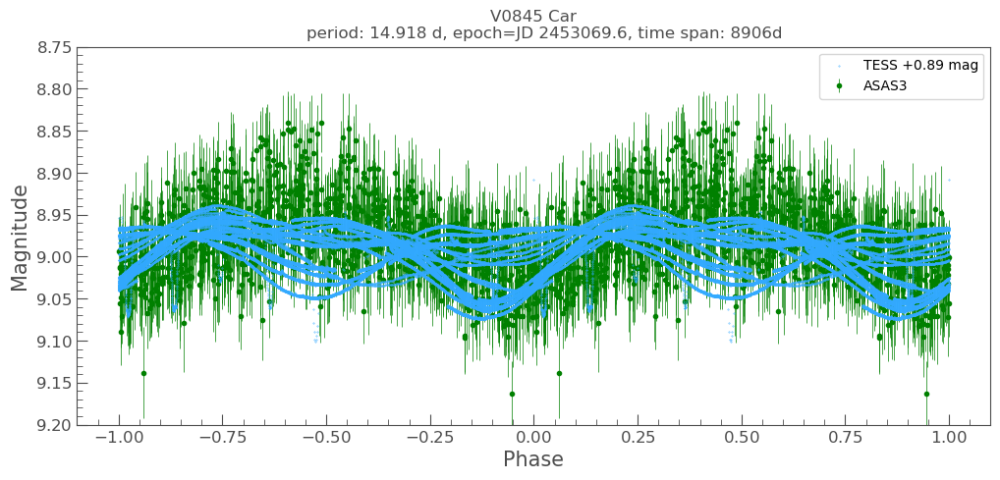

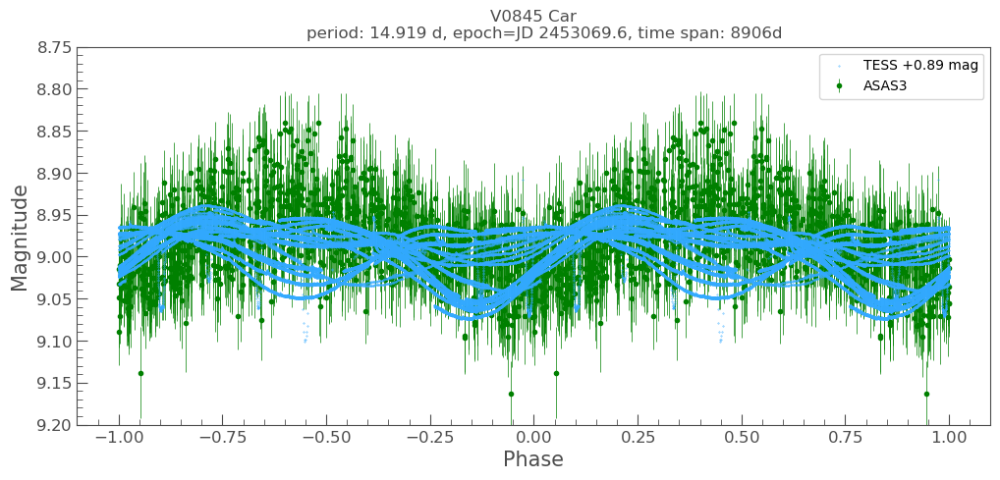

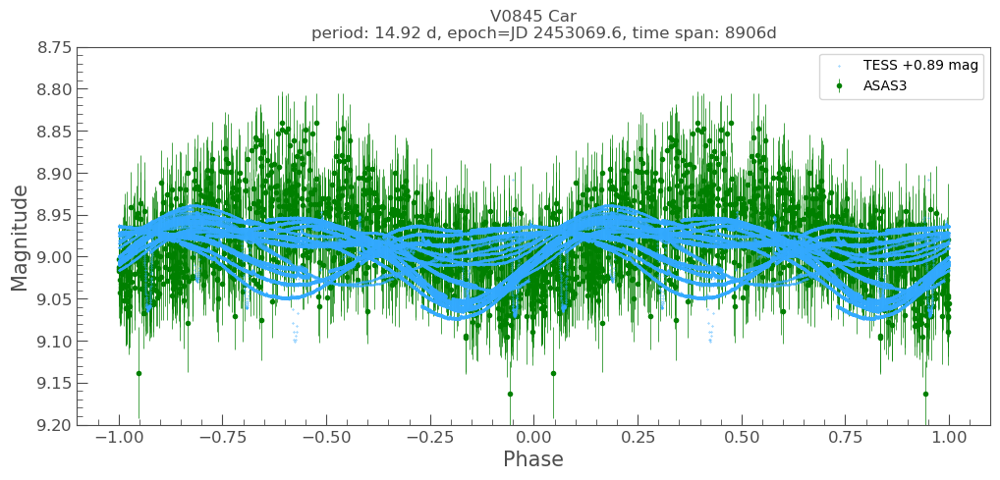

In [175]:
for rot_period_trial in np.linspace(14.905, 14.92, num=16): 
    rot_epoch_time_hjd_trial = 2453069.6  # VSX

    
    ax, lc_f_res = lkem.fold_n_plot_multi_bands(
        lc_combined_dict,
        period=rot_period_trial,
        epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
        phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
        figsize=(12, 5),
        target_name=primary_name,
        plot_options=plot_options,
    );
    ax.set_ylim(9.2, 8.75);



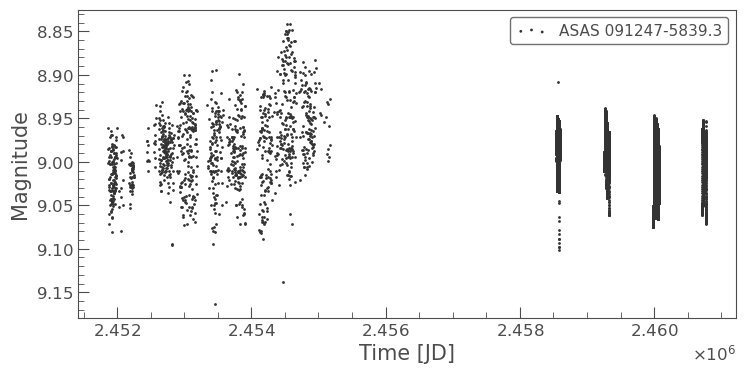

In [173]:
# the best period seems to be around 14.913 - 14.914
# export combined data for period analysis outside the notebook

lc = lke.stitch_lc_dict(lc_combined_dict, normalize=False)
lc = lc.truncate(None, 9.2, column="flux")
ax = tplt.scatter(lc);
lc.to_pandas().to_csv(f"{lk_download_dir}/tmp_in/tic385464250_tess_asas3.csv")


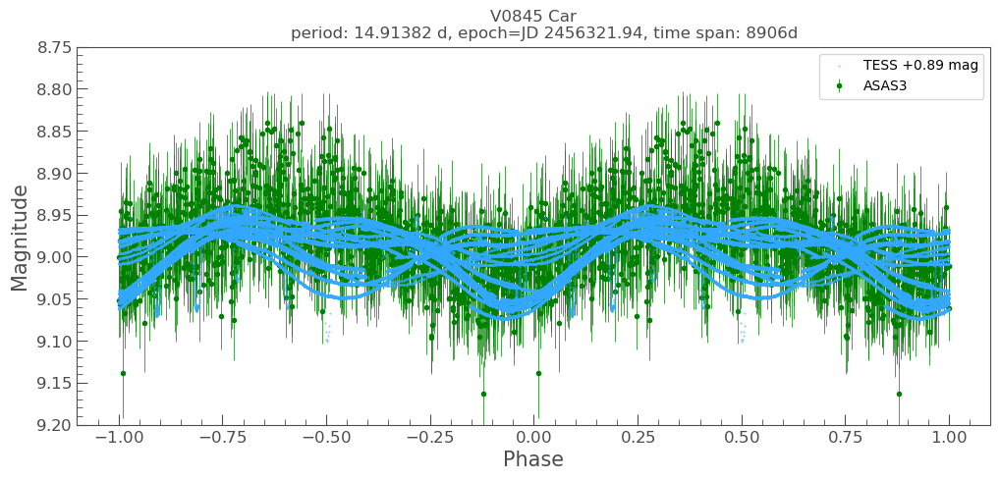

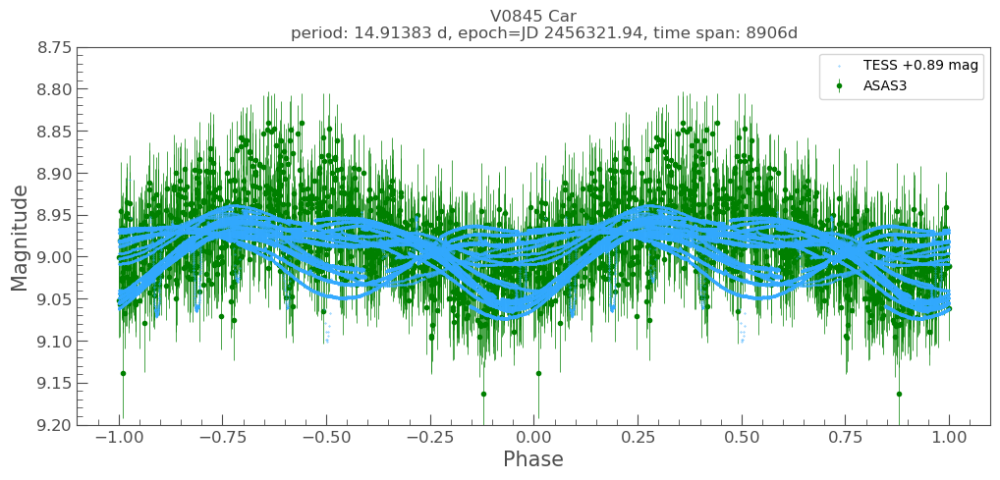

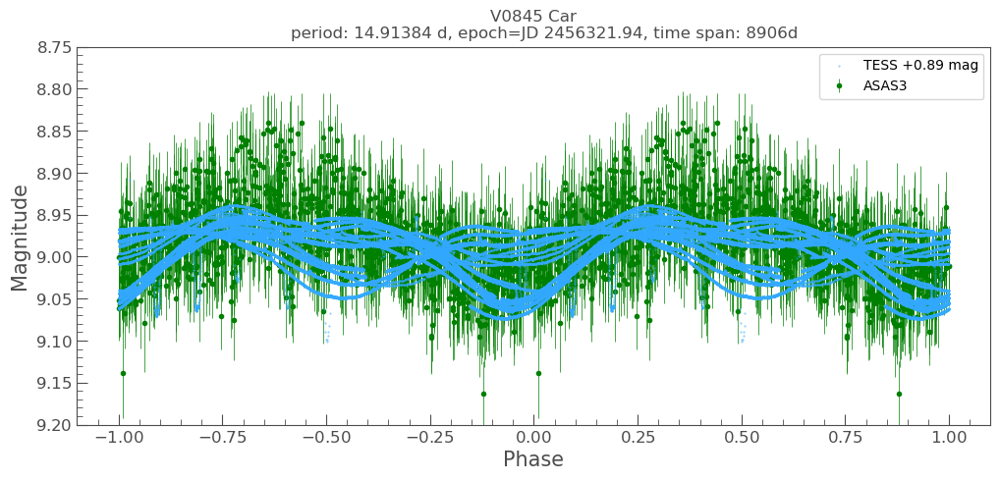

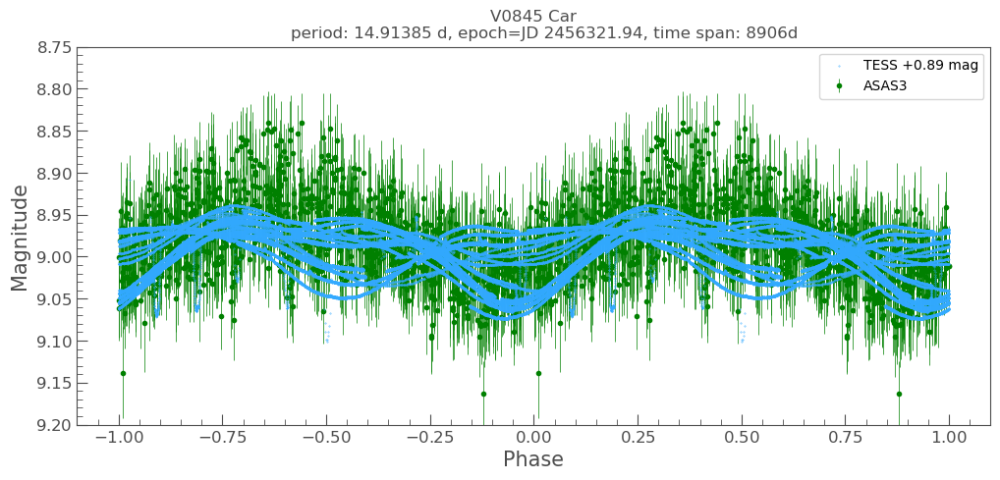

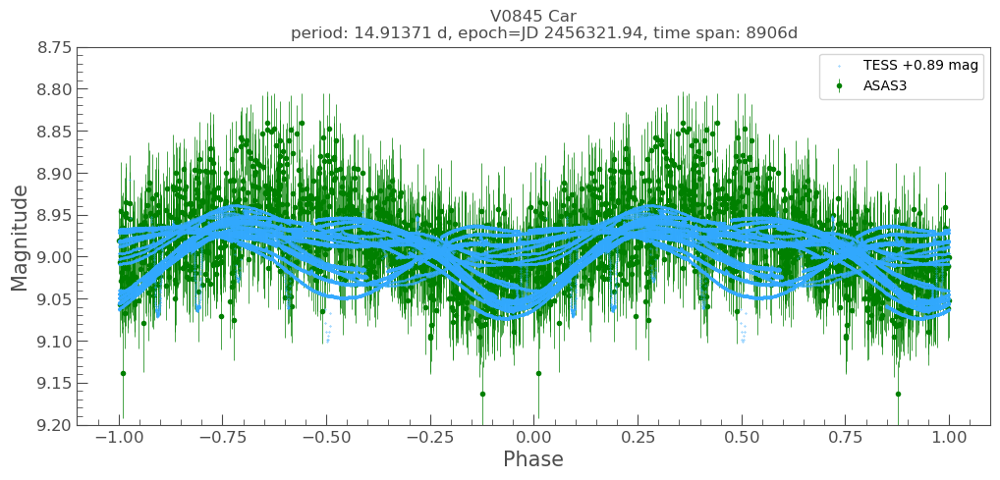

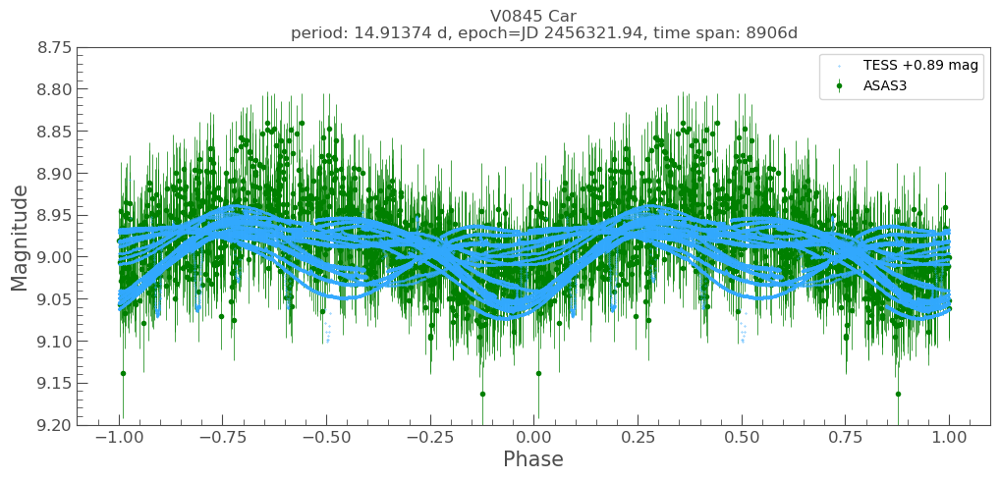

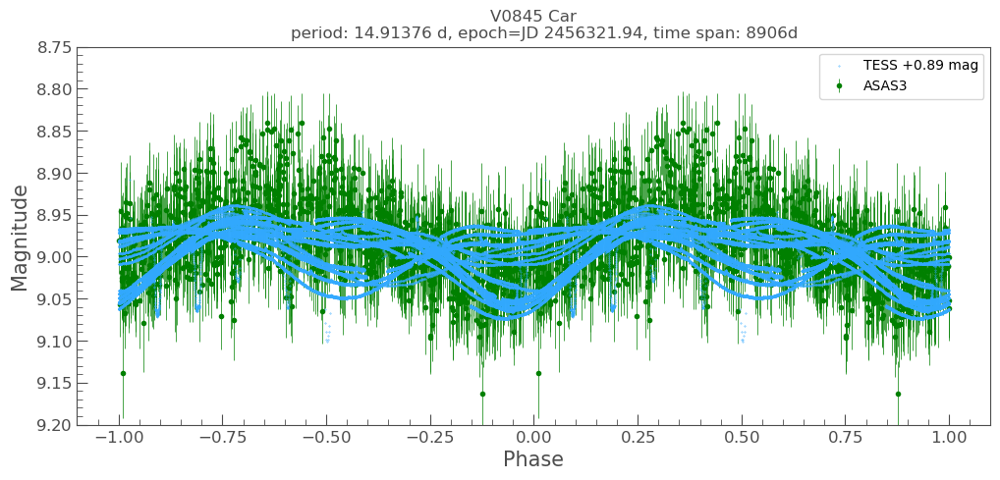

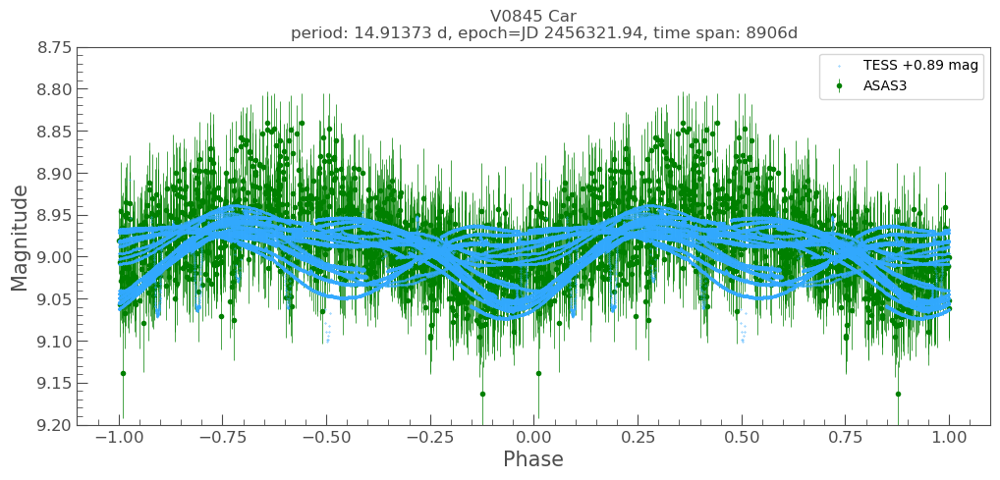

In [179]:
for rot_period_trial in [  # peaks from # VStar ANOVA
    14.91382,
    14.91383,
    14.91384,
    14.91385,
    14.91371,
    14.91374,
    14.91376,
    14.91373,
]: 

    rot_epoch_time_hjd_trial = 2456321.94  # VStar ANOVA
    
    
    ax, lc_f_res = lkem.fold_n_plot_multi_bands(
        lc_combined_dict,
        period=rot_period_trial,
        epoch=Time(rot_epoch_time_hjd_trial   , format="jd", scale="utc"),
        phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
        figsize=(12, 5),
        target_name=primary_name,
        plot_options=plot_options,
    );
    ax.set_ylim(9.2, 8.75);



#### See if there is period change in TESS data over time


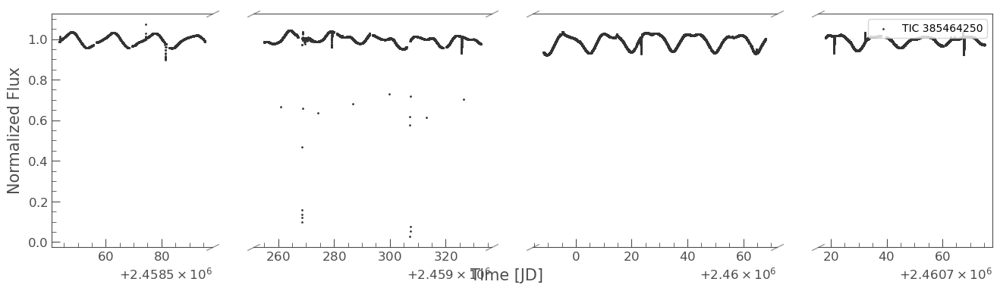

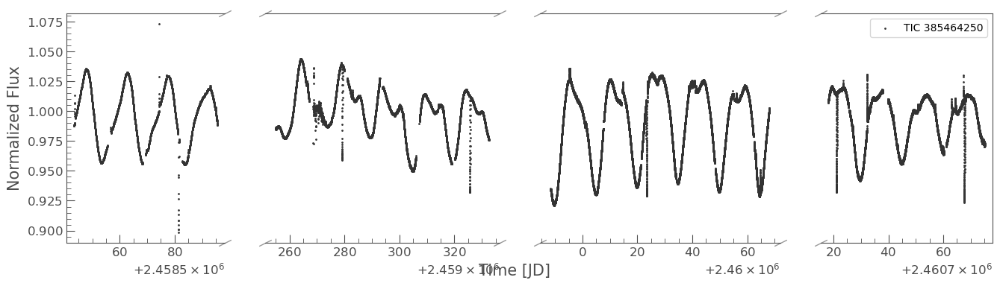

In [182]:
# See if best fits period changes over time in TESS data

# Prepare a LC from to be splitted in to different chunks to analyze separately
lc = lke.to_normalized_flux_from_mag(lc_tess)
axs = tplt.plot_skip_data_gap(lc);
lc = lc.truncate(0.85, None, column="flux")
axs = tplt.plot_skip_data_gap(lc);

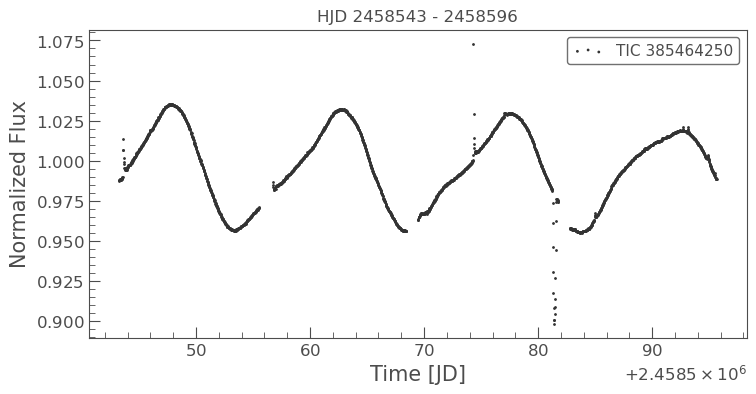

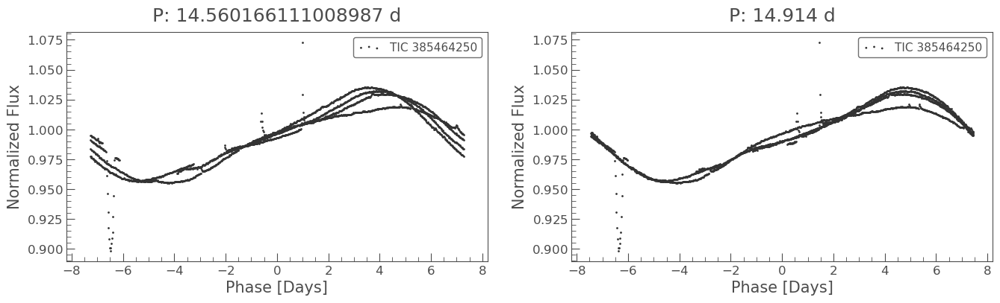

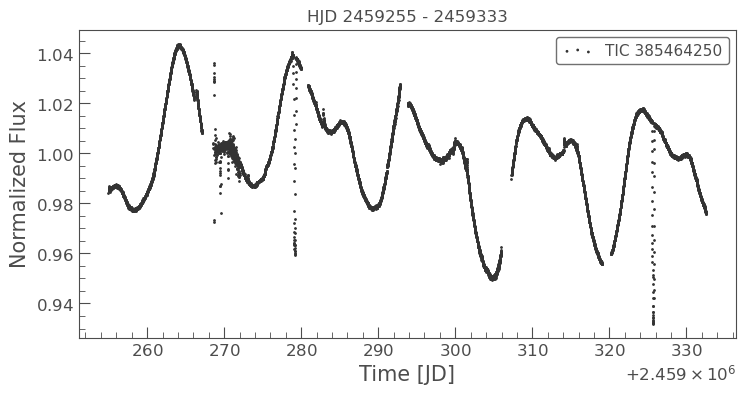

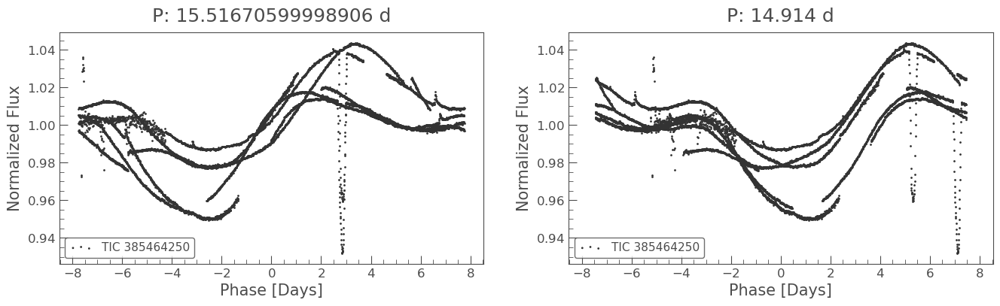

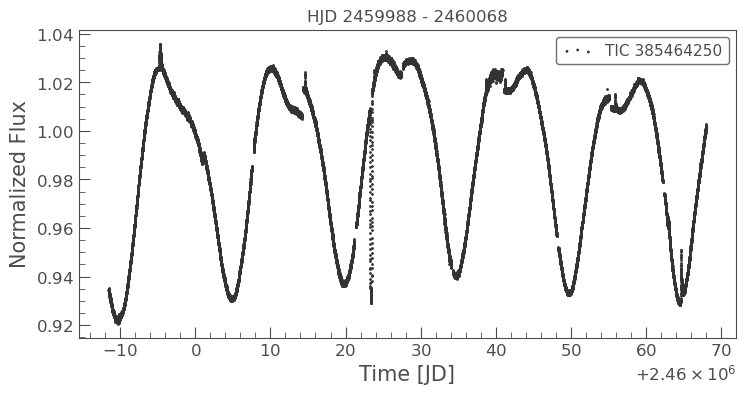

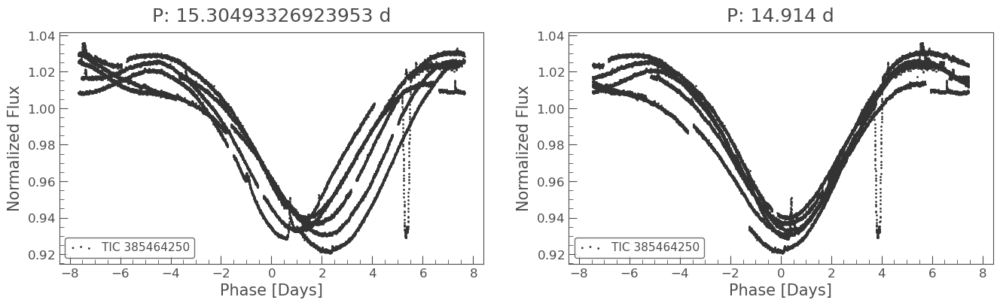

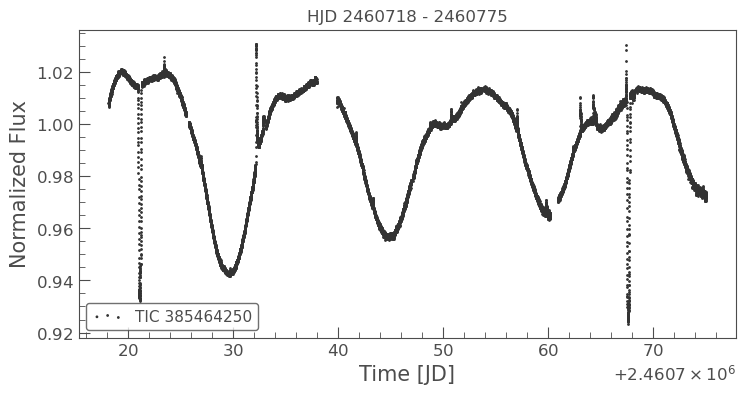

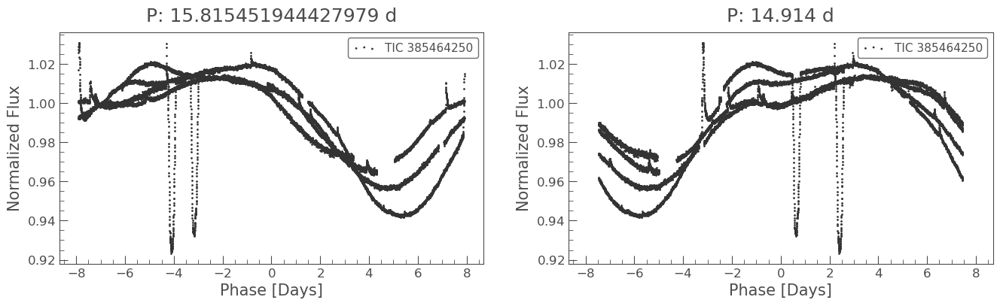

In [193]:
# _epoch_base = 2456321.94  # VStar ANOVA
_epoch_base = 2453069.6  # VSX value
_period_base = 14.914  # VStar ANOVA
for xrange in [
    (2458500,       2458500 + 100),
    (2459000 + 240, 2459000 + 340),
    (2460000 - 20,  2460000  + 80),
    (2460700 + 0,   2460700  + 80),
]:
    _lc = lc.truncate(*xrange)
    ax = _lc.scatter();
    ax.set_title(f"HJD {_lc.time.min().value:.0f} - {_lc.time.max().value:.0f}")
    
    _pg = _lc.to_periodogram()
    _lc_f1 = _lc.fold(epoch_time=_epoch_base, period=_pg.period_at_max_power)
    _lc_f2 = _lc.fold(epoch_time=_epoch_base, period=_period_base);  # to compare
    
    with plt.style.context(lk.MPLSTYLE):
        fig, axs = plt.subplots(1, 2, figsize=(16, 4), sharex=True);
        
        ax = tplt.scatter(_lc_f1, ax=axs[0]);
        ax.set_title(f"P: {_lc_f1.period}");
        ax = tplt.scatter(_lc_f2, ax=axs[1]);
        ax.set_title(f"P: {_lc_f2.period}");


#### Trial to determine the period using Multiband Lomb-Scargle

https://docs.astropy.org/en/stable/timeseries/lombscarglemb.html

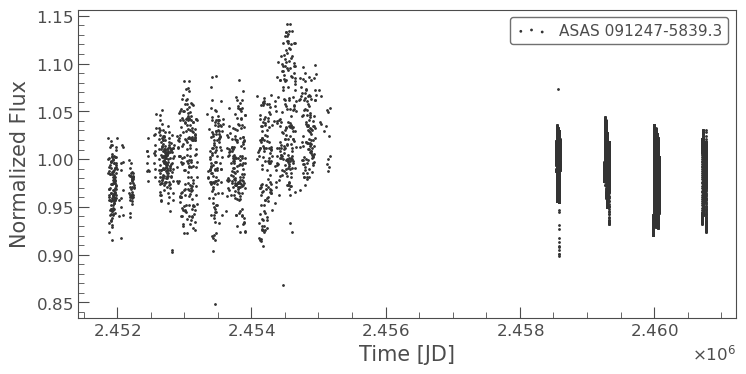

In [196]:
from astropy.timeseries import LombScargleMultiband

lc = lke.stitch_lc_di#ct(lc_combined_dict).remove_nans().remove_nans(column="flux_err")
lc = lc.truncate(0.8, None, column="flux")
tplt.scatter(lc)

lsm = LombScargleMultiband(lc.time, lc.flux, lc.source, lc.flux_err)
lsm

In [199]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

frequency = lsm.autofrequency()
period = 1 / frequency
power = lsm.power(frequency, method="fast")
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

CPU times: total: 5 s
Wall time: 3.56 s


(866238,
 <Quantity 0.29611951>,
 <Quantity 14.91088538 d>,
 <Quantity 0.0670651 1 / d>)

In [201]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

# use the frequency grid from TESS data only in plain LS
frequency = u.Quantity(np.linspace(8.96e-5, 215.99, num=2410189), unit=1/u.d)
period = 1 / frequency
power = lsm.power(frequency, method="fast")
print(len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)])
print(np.mean(np.diff(frequency)))

2410189 0.3263058260892179 14.91818392748463 d 0.06703228790185663 1 / d
8.961537871734488e-05 1 / d
CPU times: total: 9.3 s
Wall time: 7.61 s


In [210]:
%%time

# lsm.autopower(method="flexible") , aka, the default, takes forever to run, see if I can get some approx results sooner

# use a much narrower frequency range , but the grid spacing is about the same as the one used in plain LS
frequency = u.Quantity(np.arange(1/30, 1/2, step=8.962e-5), unit=1/u.d)  
print("num. freq:", len(frequency))
period = 1 / frequency
power = lsm.power(frequency, method="flexible")  # the default, takes longer than method="fast"
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

num. freq: 5208
CPU times: total: 6min
Wall time: 1min 1s


(5208,
 <Quantity 0.30564023>,
 <Quantity 15.12075739 d>,
 <Quantity 0.06613425 1 / d>)

<Quantity [15.24470805, 15.22390868, 15.20316599, 15.18247974, 15.16184971,
           15.14127567, 15.12075739, 15.10029465, 15.07988721, 15.05953486,
           15.03923737, 15.01899452, 14.9988061 , 14.97867187, 14.95859163,
           14.93856515, 14.91859223, 14.89867264, 14.87880617, 14.85899262,
           14.83923176, 14.8195234 , 14.79986731, 14.7802633 , 14.76071116] d>

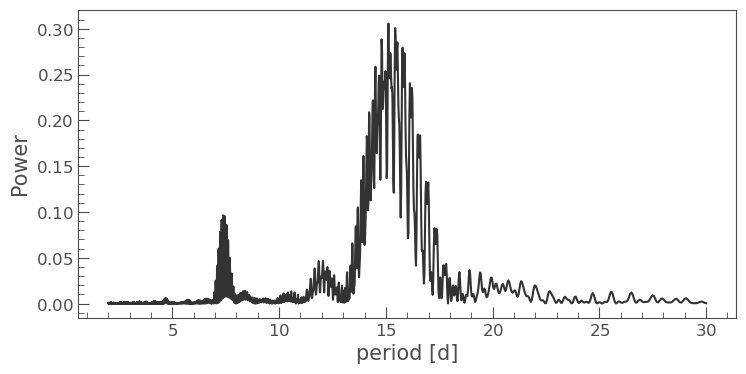

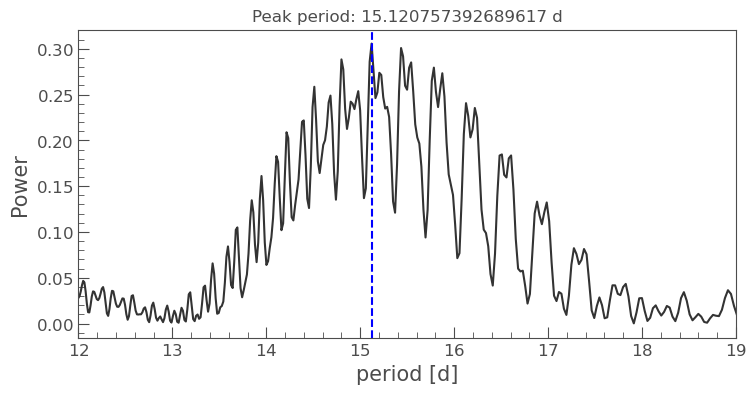

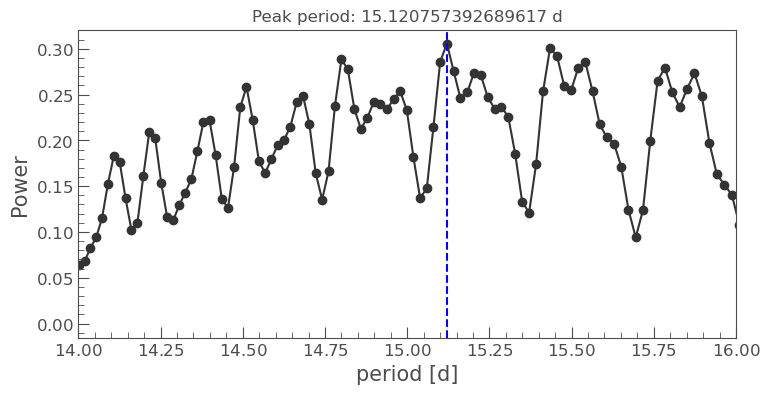

In [223]:
ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.set_xlim(12, 19);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.scatter(period, power);
ax.set_xlim(14, 16);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

# The period tried
period[(14.75 < period.value) & (period.value < 15.25)]

In [225]:
%%time

# use a much narrower frequency range , but the grid spacing is finer (smaller step size)
frequency = u.Quantity(np.arange(1/25, 1/5, step=8.962e-5 / 5), unit=1/u.d)  
print("num. freq:", len(frequency))
period = 1 / frequency
power = lsm.power(frequency, method="flexible")  # the default, takes longer than method="fast"
len(power), np.max(power), period[np.argmax(power)], frequency[np.argmax(power)]

num. freq: 8927
CPU times: total: 8min 49s
Wall time: 1min 29s


(8927,
 <Quantity 0.30674209>,
 <Quantity 15.11690294 d>,
 <Quantity 0.06615112 1 / d>)

<Quantity [15.14974217, 15.14562947, 15.141519  , 15.13741075, 15.13330474,
           15.12920096, 15.12509939, 15.12100006, 15.11690294, 15.11280804,
           15.10871537, 15.1046249 , 15.10053665, 15.09645062, 15.09236679,
           15.08828518, 15.08420577, 15.08012856, 15.07605356, 15.07198077,
           15.06791017, 15.06384177, 15.05977556, 15.05571155, 15.05164974,
           15.04759011, 15.04353267, 15.03947743, 15.03542436, 15.03137348,
           15.02732479, 15.02327827, 15.01923393, 15.01519177, 15.01115178,
           15.00711397, 15.00307833, 14.99904486, 14.99501356, 14.99098442,
           14.98695745, 14.98293264, 14.97890999, 14.97488951, 14.97087118,
           14.966855  , 14.96284098, 14.95882911, 14.9548194 , 14.95081183,
           14.94680641, 14.94280313, 14.938802  , 14.93480301, 14.93080616,
           14.92681146, 14.92281888, 14.91882844, 14.91484014, 14.91085397,
           14.90686993, 14.90288801, 14.89890823, 14.89493056, 14.89095503,
           1

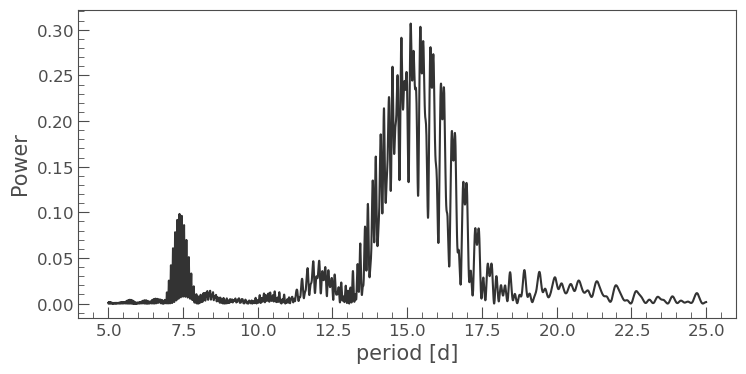

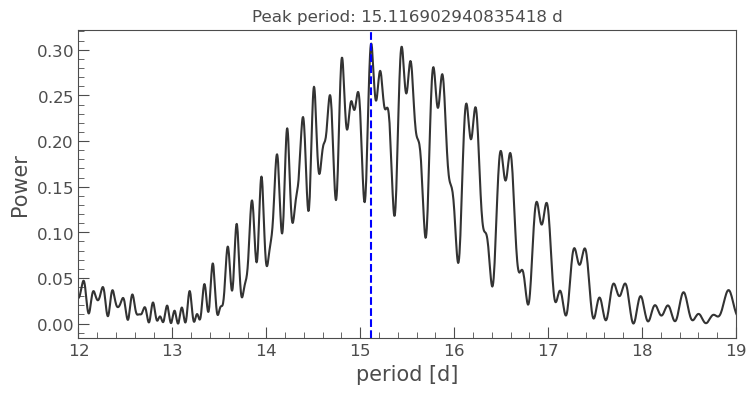

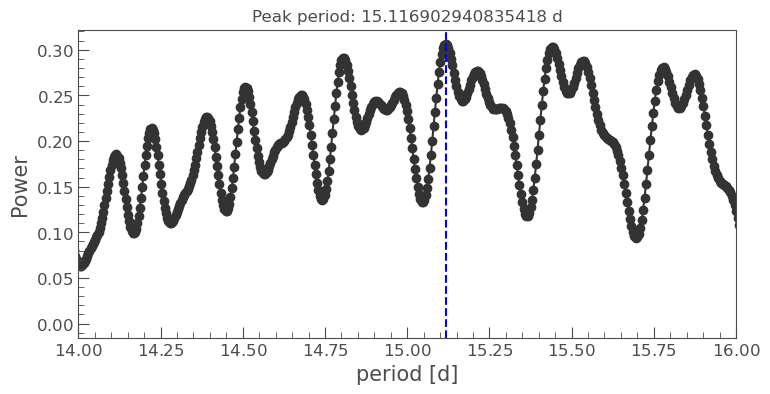

In [231]:
ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.set_xlim(12, 19);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

ax = tplt.lk_ax();
ax.plot(period, power); ax.set_xlabel("period [d]"), ax.set_ylabel("Power");
ax.scatter(period, power);
ax.set_xlim(14, 16);
ax.set_title(f"Peak period: {period[np.argmax(power)]}")
ax.axvline(period[np.argmax(power)].value, color="blue", linestyle="--");

# The period tried
period[(14.85 < period.value) & (period.value < 15.15)]

### Final rotation epoch / period

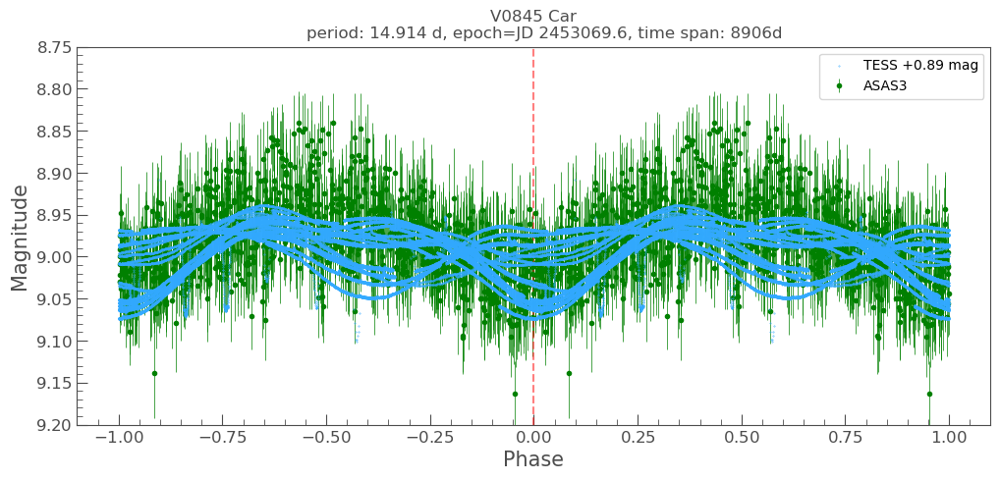

In [250]:
rot_period_final = 14.914  # VStar ANOVA, visually closest is about 14.913 - 14.914, can't really tell them apart
# rot_epoch_time_hjd_final = 2456321.94  # VStar ANOVA
rot_epoch_time_hjd_final = 2453069.6  # exsiting VSX val



ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=rot_period_final,
    epoch=Time(rot_epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(12, 5),
    target_name=primary_name,
    plot_options=plot_options,
);
ax.axvline(0, color="red", alpha=0.5, linestyle="--");
ax.set_ylim(9.2, 8.75);


## Flares

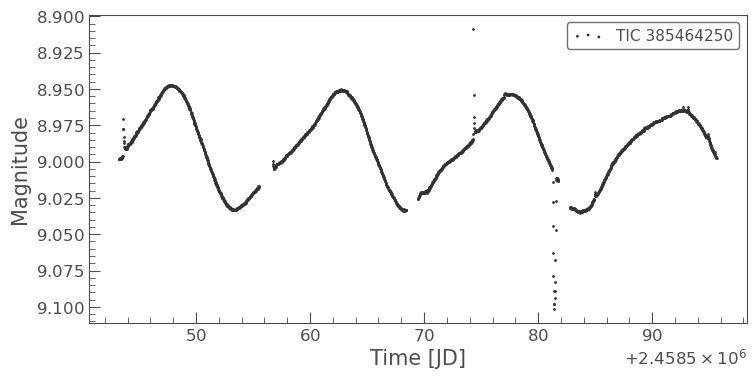

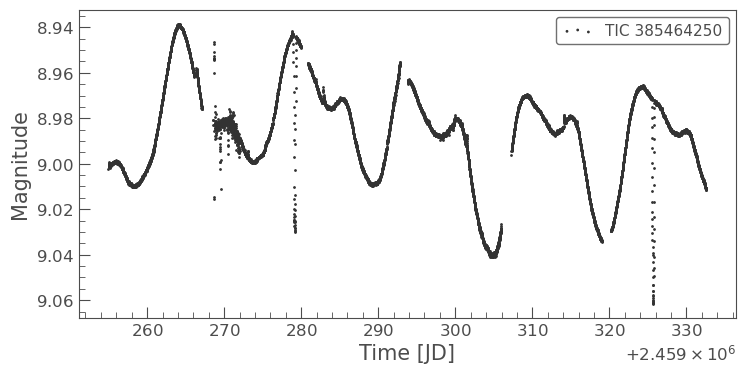

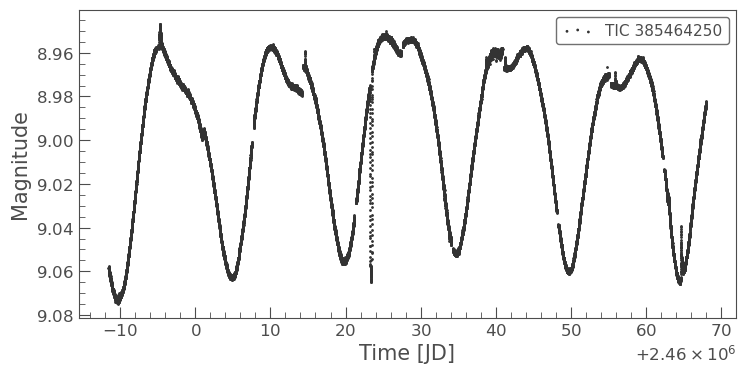

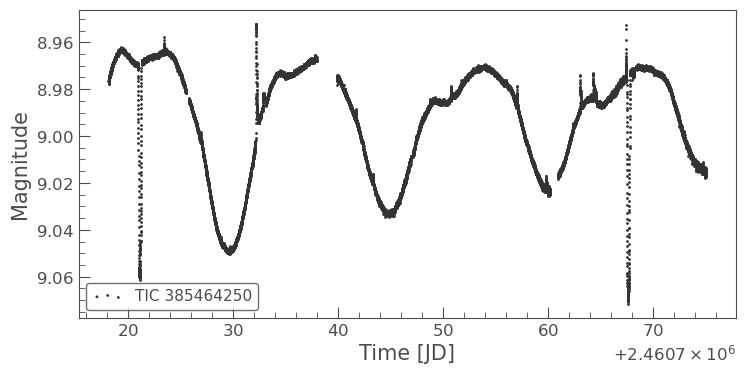

In [260]:
lc = lc_combined_dict["TESS"]
lc = lc.truncate(None, 9.2, column="flux");
# axs = tplt.plot_skip_data_gap(lc)

for xrange in [
    (2458500,       2458500 + 100),
    (2459000 + 240, 2459000 + 340),
    (2460000 - 20,  2460000  + 80),
    (2460700 + 0,   2460700  + 80),
]:
    _lc = lc.truncate(*xrange)
    ax =  tplt.scatter(_lc)


0.08

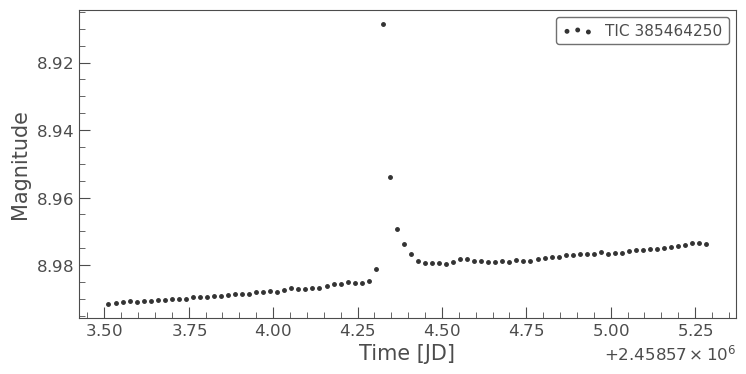

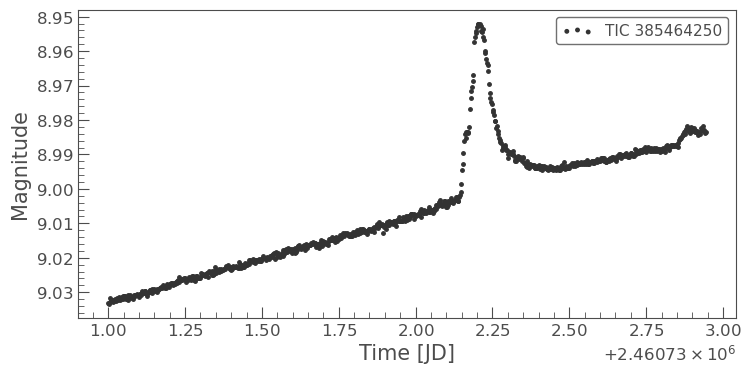

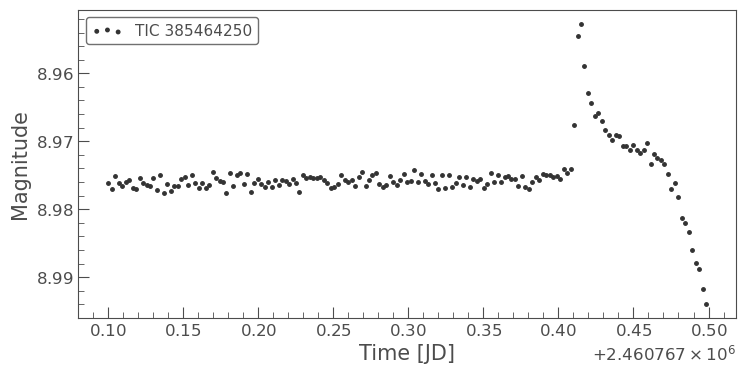

In [277]:
# zoom to candidate flares
# - note: verified on per-pixel plot to ensure it's a flare from the target, (as opposed to, say, SSO passing throuhg)
for xrange in [
    (2458573.5, 2458575.3),  # the largest amplitude seen
    (2460731, 2460733), 
    (2460767.1, 2460767.5), 
]:
    _lc = lc.truncate(*xrange)
    ax = tplt.scatter(_lc, s=25);

flare_amp_flux_mag = 0.08  # visual inspection
flare_amp_flux_mag


## Determine Eclipse amplitude (TESS)

Min I mag # num data points: 12
['8.0909', '8.1797']
(0.09,)


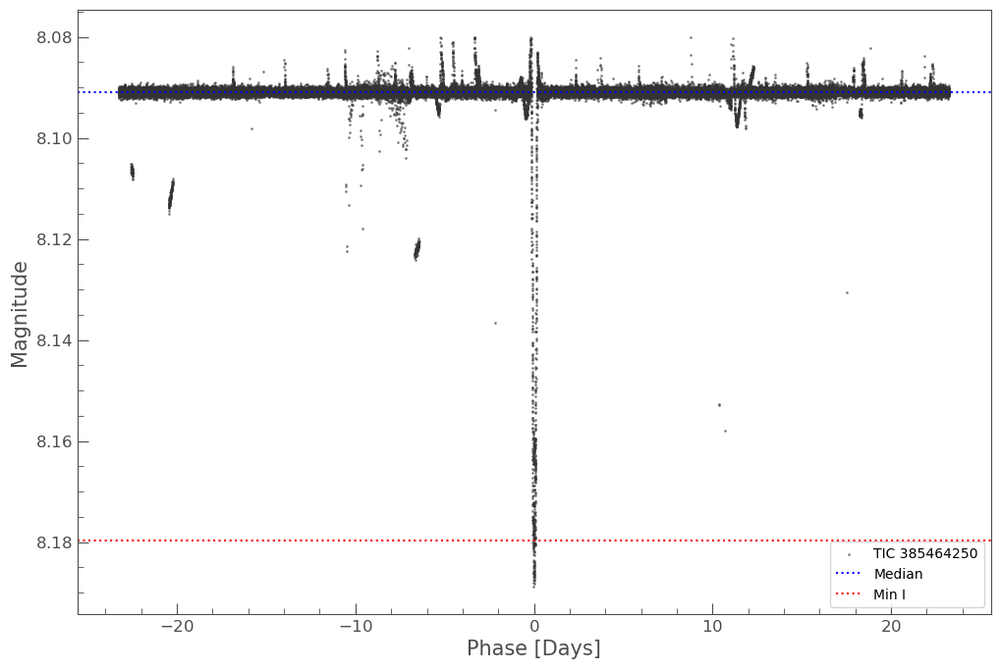

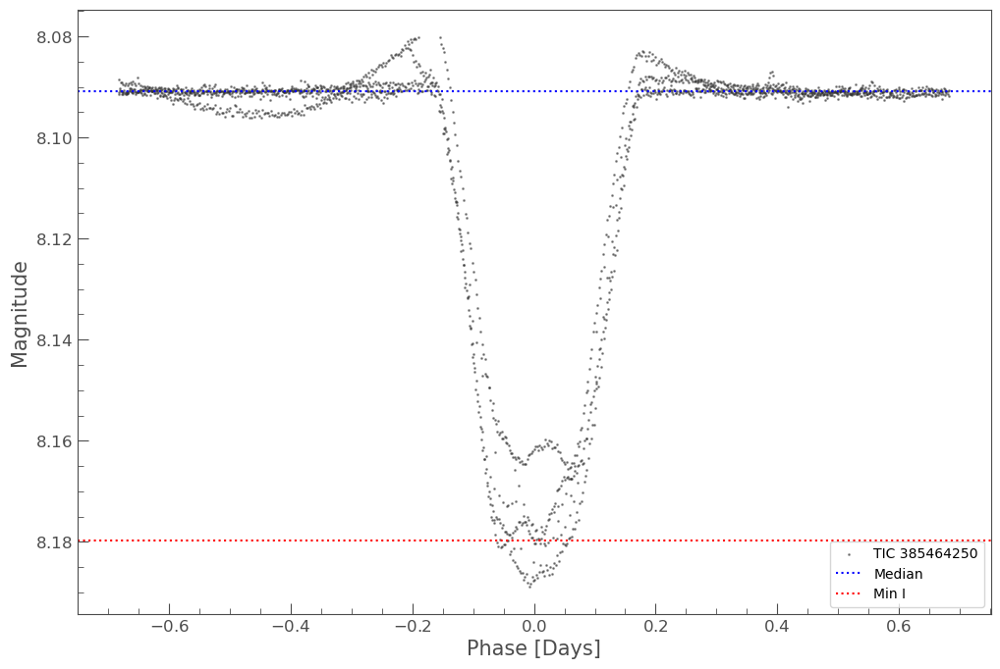

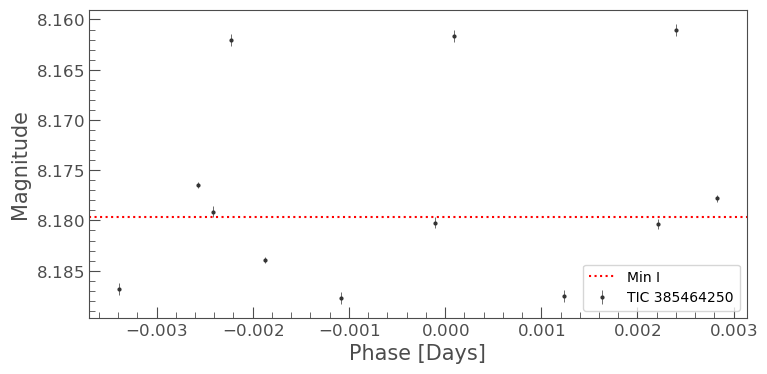

In [299]:
%matplotlib inline

lc = lc_tess_det  # the detrended TESS data, with outliers omitted

median_flux_mag = np.nanmedian(lc.flux.value)

# lc_zoom_max = lc.fold(epoch_time=epoch_time_hjd_final + 4.31, period=period_final).truncate(0 - 5 /24/60, 0 + 5 /24/ 60)  # the offset is from above cell
# print("Max mag # num data points:", len(lc_zoom_max))
# max_flux_mag = np.nanmedian(lc_zoom_max.flux.value)


lc_zoom_min = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final).truncate(0 - 5 /24/60, 0 + 5 /24/ 60)
print("Min I mag # num data points:", len(lc_zoom_min))
min_flux_mag = np.nanmedian(lc_zoom_min.flux.value)


# overall 
lc_f = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final)
ax = tplt.lk_ax(figsize=(12, 8))
ax = tplt.scatter(lc_f, ax=ax, alpha=0.5);
# ax.axhline(max_flux_mag, c="purple", linestyle="--", label="Max")
ax.axhline(median_flux_mag, c="blue", linestyle="dotted", label="Median")
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
# ax.axhline(min_ii_flux_mag, c="orange", linestyle="dotted", label="Min II")
ax.legend(loc="lower right");
# ax.set_xlim(-0.5, 0.5); 
ax.set_ylim(*ylim);


# zoom around pri
lc_f = lc.fold(epoch_time=epoch_time_hjd_final, period=period_final)
lc_f = lc_f.truncate(-duration_hr_min_i_final * 2 / 24, duration_hr_min_i_final * 2 / 24)
ax = tplt.lk_ax(figsize=(12, 8))
ax = tplt.scatter(lc_f, ax=ax, alpha=0.5);
# ax.axhline(max_flux_mag, c="purple", linestyle="--", label="Max")
ax.axhline(median_flux_mag, c="blue", linestyle="dotted", label="Median")
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
# ax.axhline(min_ii_flux_mag, c="orange", linestyle="dotted", label="Min II")
ax.legend(loc="lower right");
# ax.set_xlim(-0.5, 0.5); 
ax.set_ylim(*ylim);


# Just Min I (phase 0)
ax = tplt.errorbar(lc_zoom_min, marker="o");
ax.axhline(min_flux_mag, c="red", linestyle="dotted", label="Min I")
# ax.set_ylim(*ylim);
ax.legend();


print([f"{v:.4f}" for v in [median_flux_mag, min_flux_mag ]])


# ampitude
amp_min_i_flux_mag = np.round(np.abs(float(min_flux_mag - median_flux_mag)) , 2)  # don't hav3 3 digit precision, given the inconsistency in depth (probably due to detrend)


print((amp_min_i_flux_mag, ))


## Plots for VSX

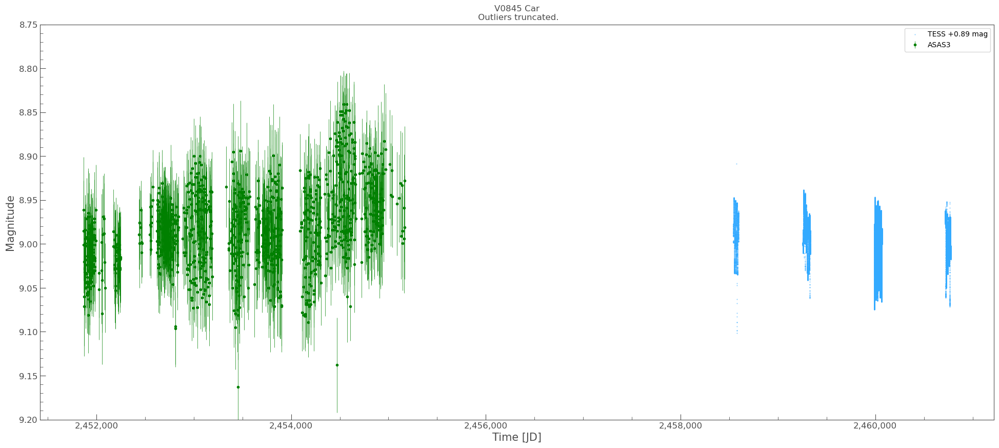

In [314]:
# reload(lkem)
# Not needed
plot_options = lkem.get_default_plot_multi_bands_options_copy()
# plot_options[0][1]["zorder"] = 4

ax = lkem.plot_multi_bands(lc_combined_dict, figsize=(24, 10), target_name=primary_name, plot_options=plot_options);
ax.set_title(ax.get_title() + "\n Outliers truncated.");
ylim = (9.2, 8.75)
ax.set_ylim(*ylim);

(9.2, 8.75)

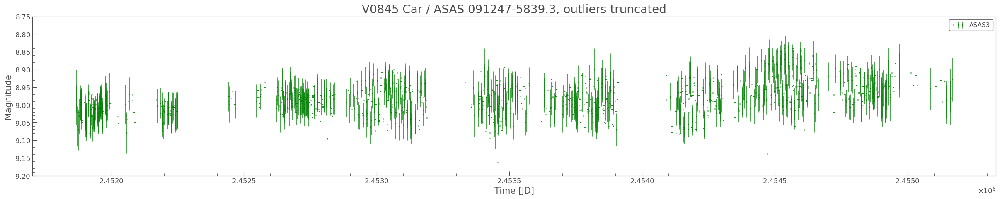

In [334]:
_lc = lc_combined_dict["ASAS3"]
_lc = _lc.copy()
_lc.meta["LABEL_TITLE"] = _lc.label
_lc.meta["LABEL"] = f"ASAS3"
ax = tplt.errorbar(_lc, **plot_options[1][1], figsize=(30, 5))
ax.set_title(f"{primary_name} / {_lc.label_title}, outliers truncated", fontsize=20);
ylim = (9.2, 8.75)
ax.set_ylim(*ylim)

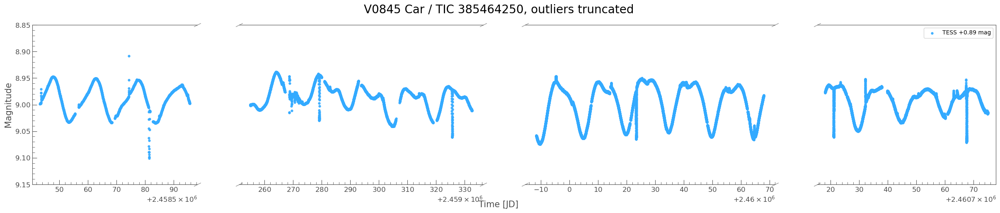

In [336]:
_lc = lc_combined_dict["TESS"]
_lc = _lc.copy()
_lc.meta["LABEL_TITLE"] = _lc.label
_lc.meta["LABEL"] = f"TESS {_lc.flux_shift:+.2f}"
axs = tplt.plot_skip_data_gap(_lc, figsize=(30,5), s=49, c=plot_options[0][1]["c"], alpha=0.9);
axs[0].get_figure().suptitle(f"{primary_name} / {_lc.label_title}, outliers truncated", fontsize=20);
ylim = (9.15, 8.85)
[ax.set_ylim(*ylim) for ax in axs];

### Phase Plot - ROT



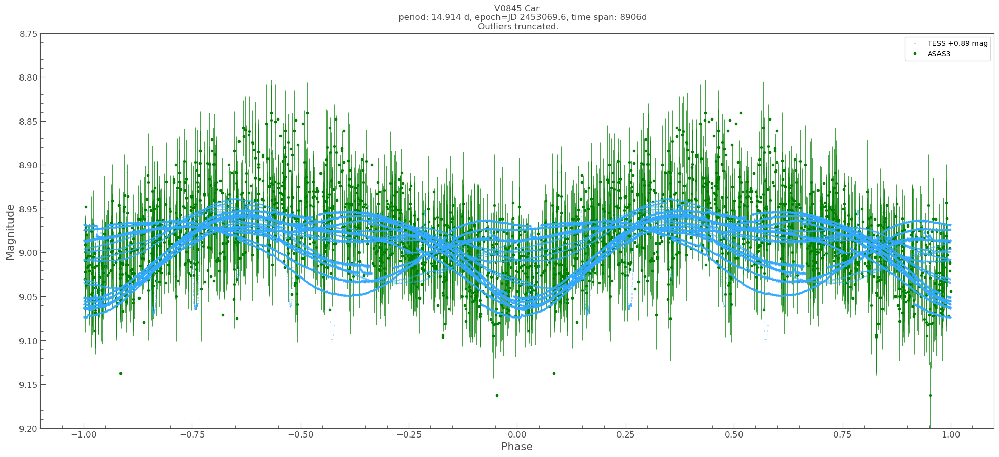

In [352]:
# reload(lkem)

plot_options = lkem.get_default_plot_multi_bands_options_copy()
plot_options[0][1]["zorder"] = 3  # default 2
# plot_options[0][1]["s"] = 4
# plot_options[1][1]["markersize"] = 9

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    lc_combined_dict,
    period=rot_period_final,
    epoch=Time(rot_epoch_time_hjd_final , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    plot_options=plot_options,
);
ylim = (9.2, 8.75)
ax.set_ylim(*ylim);
ax.set_title(ax.get_title() + "\n Outliers truncated.");


### Phase Plot - EA


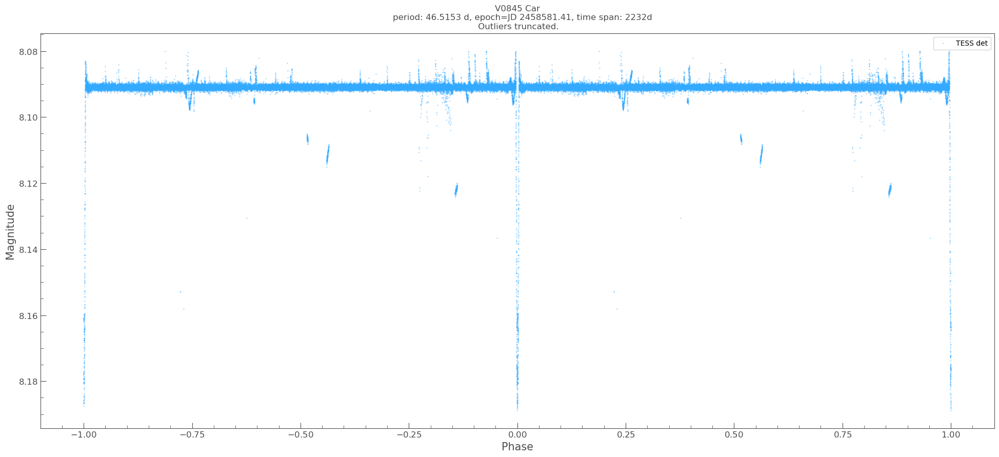

In [300]:
# reload(lkem)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_final,
    epoch=Time(epoch_time_hjd_final , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1    
    figsize=(24, 10),
    target_name=primary_name,
    # plot_options=plot_options,
);
ylim = (None, None)  # outliers pre-truncated
ax.set_ylim(*ylim);
ax.set_title(ax.get_title() + "\n Outliers truncated.");


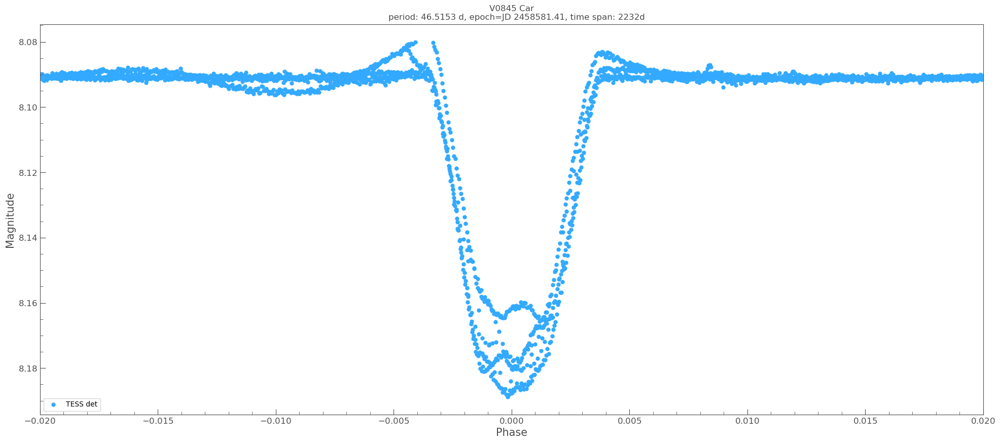

In [301]:

# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 25  # larger dots
# plot_options_zoom[0] = ('errorbar', {'marker': '.', 'c': '#3AF', 'linewidth': 0.5, 'ls': 'none'})  # use error bar

# # to workaround astropy TypeError: cannot write to unmasked output when doing matplotlib errorbar  plot
# _lc = lc_combined_dict['TESS'].copy()
# _lc.flux_err = _lc.flux_err.filled(np.nan)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS det": lc_tess_det},
    period=period_final  ,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    # duration_hr=duration_hr_min_i_final  ,  # for plotting only
    figsize=(24, 10),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
# ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.02, 0.02);  # to see primary in details



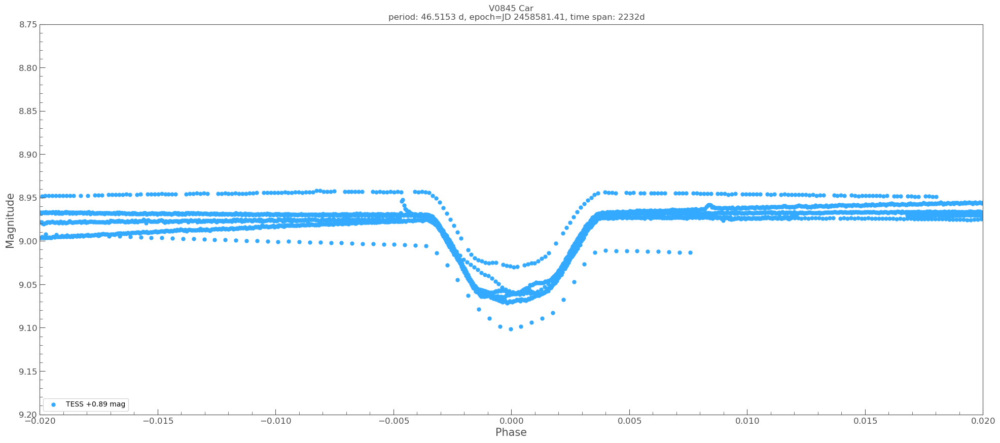

In [359]:

# zoom plot Min I
# - make TESS more visible:  larger dots
plot_options_zoom = lkem.get_default_plot_multi_bands_options_copy()
plot_options_zoom[0][1]["s"] = 25  # larger dots
# plot_options_zoom[0] = ('errorbar', {'marker': '.', 'c': '#3AF', 'linewidth': 0.5, 'ls': 'none'})  # use error bar

# # to workaround astropy TypeError: cannot write to unmasked output when doing matplotlib errorbar  plot
# _lc = lc_combined_dict['TESS'].copy()
# _lc.flux_err = _lc.flux_err.filled(np.nan)

ax, lc_f_res = lkem.fold_n_plot_multi_bands(
    {"TESS": lc_combined_dict["TESS"]},
    # {"TESS det": lc_tess_det},
    period=period_final  ,
    epoch=Time(epoch_time_hjd_final   , format="jd", scale="utc"),
    phase_scale=2,  #  fold at  period, i.e., plot from phase -1 to +1
    target_name=primary_name,
    # duration_hr=duration_hr_min_i_final  ,  # for plotting only
    figsize=(24, 10),
    plot_options=plot_options_zoom,
    # mag_shift_precision=2,  #
);
ax.set_ylim(*ylim);
ax.legend(loc="lower left");
# ax.axvline(0, c="gray", linestyle="dotted");
ax.set_xlim(-0.02, 0.02);  # to see primary in details



### Zoom Plot - flares

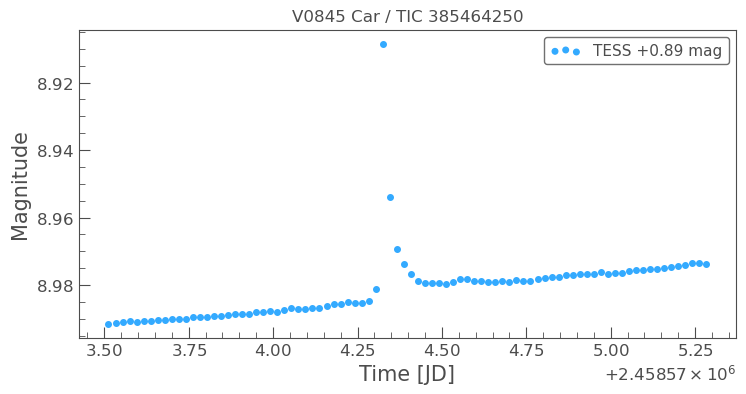

In [350]:
lc = lc_combined_dict["TESS"]
lc = lc.copy()
lc.meta["LABEL_TITLE"] = lc.label
lc.meta["LABEL"] = f"TESS {lc.flux_shift:+.2f}"

lc = lc.truncate(None, 9.2, column="flux");

plot_options = lkem.get_default_plot_multi_bands_options_copy()
for xrange in [
    (2458573.5, 2458575.3),  # the largest amplitude seen
]:
    _lc = lc.truncate(*xrange)
    ax = tplt.scatter(_lc, c=plot_options[0][1]["c"], s=64);
    ax.set_title(f"{primary_name} / {_lc.label_title}");


## VSX Report Table

In [291]:
def report_to_df(report):
    df = pd.DataFrame()
    df["Field"] = report.keys()
    df["Value"] = report.values()
    return df


def vsx_phase(phase):
    # the phase I used above is from [-0.5, +0.5]
    # convert to the phase [0, 1[ used by VSX
    if phase < -0.5 or phase > 0.5:
        raise ValueError(f"Input phase needs to be in [-0.5, 0.5] range. Actual: {phase}")
    if phase >= 0:
        return phase 
    else: 
        return 1 + phase


In [307]:
# test the num of digits needed for eclipse duration percent

print(duration_hr_min_i_final, period_final * 0.7 / 100 * 24)  # too short
print(duration_hr_min_i_final, period_final * 0.73 / 100 * 24)  # 2 digits needed

8.2 7.814570399999999
8.2 8.14948056


In [353]:
import bibs_utils
# reload(bibs_utils)


# TIC are not added, given the entry refers to thw whole system per SO
other_names = f"TIC {tic},2MASS J09124728-5839169,TYC 8595-1161-1,WISEA J091247.16-583917.1"  # TIC is not used as the primary name so it's here. Others: ExoFOP and  SIMBAD
other_names += ",CD-58 2489,CPD-58 1430"  # Useful IDs from SIMBAD, No GJ name even though it's bright

remarks = (
    f"""Eclipsing period: {period_final} d, completely different from rotational period. Min I epoch: HJD {epoch_time_hjd_final}, amplitude {amp_min_i_flux_mag} TESS, duration: {100 * duration_hr_min_i_final / 24 / period_final:.2f}% . """
    f"""Spectroscopic binary (SB2) per 2006A&A...460..695T . """  # 2012AcA....62...67K also has SB2 but it basically references 2006 paper values
    f"""Flares observed with amplitude up to {flare_amp_flux_mag} TESS. """
)

revision_comment = "Rotational period from TESS and ASAS3 data. Eclipsing type, period, epoch, amplitude from TESS data. Position from Gaia DR3. Spectral type from 2006A&A...460..695T ."


BIBS = bibs_utils.BIBS
vsx_report = dict(
    Position=f"{target_coord.ra.value}, {target_coord.dec.value}",
    # Primary_Name=primary_name,  # no change
    Other_Names=other_names,
    # OPEN: on type
    # or RS+EA+UV:  ?  use ROT+EA as RS+EA would imply a triple system, but only SB2 detected in 2006 paper
    # UV is uncertain because UV is meant for smaller dwarf (class V) while the target is giant (class III)
    Variable_Type="ROT+EA+UV:",  
    # spectall type from 2006A&A...460..695T, by way of B/mk -- https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ6879c6202389b3&-out.add=.&-source=J/A%2bA/460/695/stars&recno=541
    # details from 2006 paper -- https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-ref=VIZ690d2835396798&-out.add=.&-source=J/A%2bA/460/695/stars&recno=541
    # more recent than the current VSX value K1III (from 1975)
    Spectral_Type="K0III",  
    Spectral_Type_Uncertain=False,
    # No update on main range (still ASAS3 data like existing one)
    # Maximum_Magnitude=f"",  
    # Maximum_Magnitude_band="",
    # Minimum_Magnitude=f"",   
    # Minimum_Magnitude_band="",  
    # Minimum_Is_Amplitude=,
    Period=f"{rot_period_final}",  
    # Epoch=f"{rot_epoch_time_hjd_final:}",   # no change
    # Rise_Duration_Pct="",  # N/A for ROT (eclipse in remarks)
    # Discoverer="", 
    Remarks=remarks,
    Revision_Comment=revision_comment,
    Reference0_Name=BIBS.QLP_N,
    Reference0_Bib=BIBS.QLP_B,
    # Reference1_Name=BIBS.ASAS3_N,  # already there
    # Reference1_Bib=BIBS.ASAS3_B,
    Reference2_Name=BIBS.GAIA_DR3_N,  # for position
    Reference2_Bib=BIBS.GAIA_DR3_B,  
    Reference5_Name="Torres, C. A.; et al., 2006, Search for associations containing young stars (SACY). I. Sample and searching method",  # spectral type
    Reference5_Bib="2006A&A...460..695T",
)


def print_long_fields(report):
    other_names_list = report["Other_Names"].split(",")
    print("Other Names (1 line each):")
    print("\n".join(other_names_list))
    print("")
    print(report["Remarks"])
    print("")
    print(report["Revision_Comment"])

print_long_fields(vsx_report)
with pd.option_context('display.max_colwidth', None):
    display(report_to_df(vsx_report))


# Combined LC probably not needed for EA with no long term variation
# tic385464250_combined_plot.png : Combined light curve - Combined light curve from from TESS (QLP) and ASAS3, shifted to ASAS3.
print("""
tic385464250_tess_plot.png : TESS light curve - TESS (QLP) light curve, shifted to ASAS3. Outliers truncated.
tic385464250_phase_plot_rot.png : Rotation Phase Plot - Rotation Phase Plot from TESS (QLP) and ASAS3 data, shifted to ASAS3. Outliers truncated.
tic385464250_phase_plot_eclipses.png : EA Phase Plot - EA Phase Plot from TESS (detrended QLP) data. Outliers truncated.
tic385464250_phase_plot_eclipses_zoom_min_i.png : EA Phase Plot (Min I Zoom) - EA Phase Plot from TESS (detrended QLP) data. Zoomed around Min I.
tic385464250_tess_plot_flare_zoom.png : Flare Plot (Zoom) - TESS (QLP) light curve, shifted to ASAS3. Zoomed around the flare with the largest amplitude.
""")


Other Names (1 line each):
TIC 385464250
2MASS J09124728-5839169
TYC 8595-1161-1
WISEA J091247.16-583917.1
CD-58 2489
CPD-58 1430

Eclipsing period: 46.5153 d, completely different from rotational period. Min I epoch: HJD 2458581.41, amplitude 0.09 TESS, duration: 0.73% . Spectroscopic binary (SB2) per 2006A&A...460..695T and 2012AcA....62...67K . Flares observed with amplitude up to 0.08 TESS. 

Rotational period from TESS and ASAS3 data. Eclipsing type, period, epoch, amplitude from TESS data. Position from Gaia DR3. Spectral type from 2006A&A...460..695T .


,Field,Value
0,Position,"138.19705783604, -58.65482493264"
1,Other_Names,"TIC 385464250,2MASS J09124728-5839169,TYC 8595-1161-1,WISEA J091247.16-583917.1,CD-58 2489,CPD-58 1430"
2,Variable_Type,ROT+EA+UV:
3,Spectral_Type,K0III
4,Spectral_Type_Uncertain,False
5,Period,14.914
6,Remarks,"Eclipsing period: 46.5153 d, completely different from rotational period. Min I epoch: HJD 2458581.41, amplitude 0.09 TESS, duration: 0.73% . Spectroscopic binary (SB2) per 2006A&A...460..695T and 2012AcA....62...67K . Flares observed with amplitude up to 0.08 TESS."
7,Revision_Comment,"Rotational period from TESS and ASAS3 data. Eclipsing type, period, epoch, amplitude from TESS data. Position from Gaia DR3. Spectral type from 2006A&A...460..695T ."
8,Reference0_Name,"Huang, C. X.; et al., 2020, Photometry of 10 Million Stars from the First Two Years of TESS Full Frame Images: Part I"
9,Reference0_Bib,2020RNAAS...4..204H



tic385464250_tess_plot.png : TESS light curve - TESS (QLP) light curve, shifted to ASAS3. Outliers truncated.
tic385464250_phase_plot_rot.png : Rotation Phase Plot - Rotation Phase Plot from TESS (QLP) and ASAS3 data, shifted to ASAS3. Outliers truncated.
tic385464250_phase_plot_eclipses.png : EA Phase Plot - EA Phase Plot from TESS (detrended QLP) data. Outliers truncated.
tic385464250_phase_plot_eclipses_zoom_min_i.png : EA Phase Plot (Min I Zoom) - EA Phase Plot from TESS (detrended QLP) data. Zoomed around Min I.
tic385464250_tess_plot_flare_zoom.png : Flare Plot (Zoom) - TESS (QLP) light curve, shifted to ASAS3. Zoomed around the flare with the largest amplitude.

